# Playing Linus Pauling: a protein folding simulation

*Thanks go to Dr. Phil Bradley at the Fred Hutchinson Cancer Research Center for helping me come up with the idea for this project and helping me troubleshoot it.*

While sick in bed, the American biochemist Linus Pauling started coming up with the structure of the alpha helix, one of the most common secondary protein structures. His structure turned out to be correct, and it is found in many proteins. This final project as about playing Linus Pauling in that the goal is to create an algorithm that correctly folds an amino acid sequence into an alpha-helix.

Proteins are critical for life as we know it. They are made up of individual amino acids that are joined together in peptide bonds. There are a total of 20 common amino acids, each of which have a backbone that is identical between amino acids and a unique sidechain that is unique to the amino acid (fig. 1). These peptides then fold into 3-D functional proteins. 

The structure of a protein determines its function. The structure in turn is determined by the amino acid sequence of a protein. Protein structures are often hard to determine (though it can be done using methods like X-ray crystallography, nuclear magnetic resonance (NMR) or Cryo-EM). However, this is a time consuming process, and sometimes it is not possible to get a structure.

<img src="files/Chemical schematic of a protein.jpg">
Figure 1. Schematic of a polypeptide chain. Each box depicts the basic chemical structure of an amino acid. Peptide bonds between amino acids are highlighted in blue. This basic structure is the same across all amino acids, the difference between individual amino acids is the chemical makeup of the side chain (also referred to as the R group), depicted in green.

It is often interesting to predict the effect of single amino acid changes on the structure of a protein, as this would give us clues about the functional effect of a mutation (e.g. in disease). However, it is probably needless to say, that there are more interesting experiments to conduct than resources to determine structures using real life experiments. Consequently, predicting the structure of a protein *in-silico* is an attractive alternative. However, protein folding is an NP-hard problem (Pierce, N. A., & Winfree, E., 2002), and 3D protein structures have yet to be predicted with the same accuracy as experimental methods.

Protein structure is divided into four levels: primary to quaternary structure. Primary structure refers to the linear sequence of amino acids that characterizes a peptide chain. Secondary structure refers to the local three dimensional structure of a segment of protein and is created by interactions of the amino acid backbones. The most common secondary structures are alpha-helices and beta-sheets. Secondary structures will also be the main subject of this simulation. Tertiary structures refer to the 3D folding of a protein that is created by the interaction of the individual amino acids sidechains. Finally, quaternary structure refers to the arrangement of protein subunits and their interactions. 

Here I will start with a sequence that has been determined to fold correctly into an alpha-helix (by X-ray crystallography), perturb it, and then use an algorithm to make it fold back to its original confirmation. But first, some more background...

## Thermodynamics & factors affecting protein folding
Molecules always tend toward their lowest energy state. This is also true for proteins, an unfolded protein in solution will wiggle around and take on different confirmations until it reaches its lowest energy confirmation (though it can get stuck in local minima). There are several forces at play here, I have described some of them below:
- **The hydrophobic 'force'**: some amino acids have hydrophillic side chains, this makes them 'happy' (i.e. they are in a lower energy state) touching water. Others have hydrophobic side chains, this makes them 'unhappy' touching water. Many proteins exist in solution (i.e. largely water), and given that they are made up of both hydrophobic and hydrophillic amino acids, the protein will have reached a low energy state when it has folded such that the hydrophobic residues are burried on the inside (not touching water), while the hydrophillic residues are on the surface touching water.
- **Van der Waal forces**: each atom has an electron cloud consisting of electrons that surround the nucleus. The location of the electrons changes, thus creating regions that are more negatively charged than others (dipoles). In van der Waals interactions, a positive dipole can interact with a negative dipole forming a non-covalent bond. In short, van der Waals interactions can lead to the attraction of two atoms, however, if they get too close to each other they will begin to repell each other.
- **Hydrogen bonds**: these bonds are formed between a proton (positively charged) and an electronegative atom (an atom with the tendency to attract a shared pair of electrons). Alpha helices are stabilized by hydrogen bonds between atoms in the backbones of the individual amino acids.

Other forces that will influence the stability of a protein are disulfide bonds, the solution a protein is in, salt concentration, pH and temperature. Protein folding simulations need to take these forces into account by approximating them as part of their objective function. Running a protein folding simulation can in itself be informative for our understanding of how proteins fold in nature. For example, if it is possible to get a protein to fold *in silico* using only van der Waals forces, we know that van der Waals forces are indeed an important component for proteins to be able to fold. If it is not possible to fold a protein *in silico* with only van der Waals forces being a part of the objective function, then we might conclude that there are more components to protein folding in nature. Put another way, simulations are an efficient way to test models and hypotheses we may have on how proteins fold.

Overall, the goal will be to minimize the energy as calculated by the objective function. 

## PyRosetta & other required packages
PyRosetta is a python based library that allows users to interact with Rosetta, a protein modelling suite that can be used for protein design and to calculate energy functions of protein conformations (Chaudhury, S. et al, 2010). This simulation will require PyRosetta to calculate the energy state of a protein, (this involves calculating several interaction forces between all of the atoms in a protein structure).

In addition to PyRosetta the following packages are required for this simulation to work, links are to websites that give instructions for their installation:
- pyrosetta: used to calculate energies and to edit the protein structure (http://www.pyrosetta.org/dow)
- nglview: used to view protein structures (https://anaconda.org/conda-forge/nglview)
- libxml2: required for nglview (https://anaconda.org/anaconda/libxml2)
- libxslt: required for nglview (https://anaconda.org/anaconda/libxslt)
- ssbio: required for nglview (https://buildmedia.readthedocs.org/media/pdf/ssbio/latest/ssbio.pdf)

Additionally, for this to work in jupyter notebooks, widgetsnbextension, ipywidgets and ipython need to be installed. For installation tips/troubleshooting of ssbio take a look at the following website: https://github.com/SBRG/ssbio/wiki/Troubleshooting#nglviewer-fresh-install-tips 

Note that PyRosetta (and maybe some of the other libraries) are notoriously hard to install on Windows machines, as a Linux system is required to get pyrosetta running. To install on windows it is necessary to install Ubuntu as a subsystem (described in the pyrosetta installation guide).

In [1]:
# Load and initialize all required packages
from pyrosetta import *
from pyrosetta.toolbox import *
init() # this is to initialize pyrosetta and to make sure it is working
import nglview as nv
import random
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

PyRosetta-4 2019 [Rosetta PyRosetta4.Release.python37.linux 2019.39+release.93456a567a8125cafdf7f8cb44400bc20b570d81 2019-09-26T14:24:44] retrieved from: http://www.pyrosetta.org
(C) Copyright Rosetta Commons Member Institutions. Created in JHU by Sergey Lyskov and PyRosetta Team.
core.init: Checking for fconfig files in pwd and ./rosetta/flags
core.init: Rosetta version: PyRosetta4.Release.python37.linux r233 2019.39+release.93456a5 93456a567a8125cafdf7f8cb44400bc20b570d81 http://www.pyrosetta.org 2019-09-26T14:24:44
core.init: command: PyRosetta -ex1 -ex2aro -database /home/mjg/anaconda3/PyRosetta4.Release.python37.linux.release-233/pyrosetta/database
basic.random.init_random_generator: 'RNG device' seed mode, using '/dev/urandom', seed=-902868398 seed_offset=0 real_seed=-902868398
basic.random.init_random_generator: RandomGenerator:init: Normal mode, seed=-902868398 RG_type=mt19937


_ColormakerRegistry()

## The alpha helix
The alpha helix I will be working with is from the glucagon hormone (this can be accessed on PDB with the following accession: 1gcn, or here: https://www.rcsb.org/structure/1gcn). This structure was determined using X-ray crystallography. Before storing and loading the file I removed any atoms that were not part of the alpha-helix section using a text editor.

Additionally, the following structures are also in this folder and can be loaded by changing the accession code in the pose_from_pdb() function. I ran this simulation for all of the structures below with similar results (though the glucagon structure is the one I tested the most). All structures were chosen such that they have no or few prolines and glycines, as these typically tend to disrupt alpha helices.
- 1nkp.pdb: full basic helix loop helix leucine zipper of the Myc protein (X-ray structure)
- 1nkp_lz.pdb: only the leucine zipper of the Myc protein (X-ray structure)
- 1gnc.pdb: full length alpha helix from glucagon (X-ray structure)
- 5oqk.pdb: alpha helix from the human Hv1/VSOP (Voltage-gated proton channel) protein (NMR structure)

The correctly folded glucagon alpha-helix is visualized below. I will start by scrambling up all amino acid backbone angles, then I will attempt to have the computer recreate the original fold. The coloured ribbon represents the protein's backbone, while the balls and sticks represent the atoms of the individual side chains.

Note that with nglview it is possible to rotate the structure and zoom in on certain parts. This is only possible if one runs the notebook, otherwise the output of a section of code that is meant to visualize the protein will only say NGLWidget(). Nonetheless, I have included static images of every important aspect of the simulation.

In [2]:
# Load the structure
helix = pose_from_pdb("1gcn.pdb")
view = nv.show_rosetta(helix)
view.add_ball_and_stick()
view

core.chemical.GlobalResidueTypeSet: Finished initializing fa_standard residue type set.  Created 980 residue types
core.chemical.GlobalResidueTypeSet: Total time to initialize 4.79688 seconds.
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18


NGLWidget()

<img src="files/alpha_helix.png" style="height: 250px">

The amino acid sequence of the above helix is shown below in one letter abbreviations (e.g. L is a leucine, and A is an alanine). For a full key please consult the following website: https://molbiol-tools.ca/Amino_acid_abbreviations.htm

In [4]:
helix.sequence()

'SDYSKYLDSRRAQDFVQW'

## Scoring
As mentioned, proteins will tend to favour lower energy conformations. For a simulation to find the lower energy conformations, the total energy needs to be estimated. There are several models that could be used. The most simple one is probably the Lennard Jones (LJ) potential model.

#### Lennard Jones potential
The LJ potential describes the potential energy interaction between two non-bonded atoms that are interacting with van der Waal forces. The total potential energy of the interaction depends on the distance between the two atoms. When two atoms are an infinite distance apart, they are neither attracting nor repelling each other. As they move closer, they will start attracting each other, until a point when they get too close to each other, at which point they will start repelling each other because they begin to invade each other's space.

Thus, mathematically, the LJ potential consists of two terms, an attractive term and a repelling term. This can be expressed as follows:

$$ V = 4\epsilon  \Bigg\lbrack \Big( \frac{\sigma}{r} \Big)^{12} - \Big( \frac{\sigma}{r} \Big)^6 \Bigg \rbrack$$

Where
- $V$ is intermolecular potential between the two atoms or molecules
- $\epsilon$ is a measure of how much the atoms attract each other (fig. 2)
- $\sigma$ is the distance at which the intermolecular potential between the two atoms is zero (this is equivalent to the van der Waals radius (fig. 2)
- $r$ is the distance between both atoms

Note that the values for $\epsilon$ and $\sigma$ change depending on the atoms in question and they have to be experimentally determined. If one is trying to calculate the LJ potential between two non-identical atoms things have to be averaged out. 

<img src="files/LJP.jpg" width="500px">
Figure 2. Lennard Jones potential curve showing the potential energy on the y-axis an the distance between two atoms on the x-axis. (Image source: Chem Libre Texts). 

PyRosetta allows us to set up a scoring function with just these two terms. This is done below, and the total potential energy for the native alpha helix is calculated. Note that fa_atr stands for full atom attraction, and fa_rep stands for full atom repulsion. Each component can also be given a weight. When the scores are printed out, the raw (unweighted score) and the weighted score are printed, as well as the total score of both components combined.

The following lists the score of the correctly folded conformation using the LJ potential function.

In [5]:
scorefxn = ScoreFunction()
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_atr, 1.0)
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_rep, 0.5)
print(scorefxn.show(helix))

core.scoring.etable: Starting energy table calculation
core.scoring.etable: smooth_etable: changing atr/rep split to bottom of energy well
core.scoring.etable: smooth_etable: spline smoothing lj etables (maxdis = 6)
core.scoring.etable: smooth_etable: spline smoothing solvation etables (max_dis = 6)
core.scoring.etable: Finished calculating energy tables.
core.scoring.ScoreFunction: 
------------------------------------------------------------
 Scores                       Weight   Raw Score Wghtd.Score
------------------------------------------------------------
 fa_atr                       1.000     -62.918     -62.918
 fa_rep                       0.500      72.039      36.020
---------------------------------------------------
 Total weighted score:                      -26.898
None


### Other important scoring terms explained
Alpha helices are stabilized by hydrogen bonds between atoms of the backbones. Thus, for the purposes of this simulation I will give extra weight to these interactions in some instances.

Additionally, to reduce the complexity of this assignment I will only change the angles of the backbones. There are three different angles that I could manipulate. The two angles between backbone atoms (phi and psi angles, fig. 3), or the angles at which the side chains (R-groups) are attached (these are the ones I will not change). Besides reducing complexity, changing these angles should not be necessary to get an alpha-helix to fold, as this structure does not involve interactions between the sidechains (in theory). Since the sidechain angles are never changed, they will remain in the correct conformation from the moment the correct structure is read in.

<img src="files/Protein_backbone.png" width="200px">
Figure 3. Depiction of a protein backbone with the phi $\phi$ and $\psi$ angles labeled. Image source: Wikipedia.

Consequently, I will also remove any effect of the sidechains on the energy calculations for more complex energy calculations (this is done by removing the Dunbrack term). 

## Making moves
As mentioned, only the phi and psi angles will be changed. At the start of each move, a random residue will be selected that will subsequently be changed. To ensure that the entire state-space can be explored, the algorithm selects from one of the following options: change a phi angle, change a psi angle, or change both. Each option will be chosen with an equal probability. The reason for all three options is that it is concievable that the simulation may get stuck in a local minimum and can only get out by changing both angles simultaneously. A new randomly chosen value (between 0 and 360) is then assigned to the angle(s) and the score is returned.

In [3]:
def changeConfirmation(struc):
    # Select a random residue in the structure
    res = random.randint(0, struc.total_residue() - 1)
    
    # Randomly pick an angle to change it to
    angle = random.randint(0, 360)
    
    # this variable defines if the phi or the psi angle is being changed
    phi_or_psi = random.randint(0, 2)
    
    if phi_or_psi == 0:
        struc.set_phi(res + 1, angle)
    elif phi_or_psi == 1:
        struc.set_phi(res + 1, angle)
    else:
        angle2 = random.randint(0, 360)
        struc.set_phi(res + 1, angle)
        struc.set_phi(res + 1, angle2)
        
    score = scorefxn(helix)
    return(score)

## Evaluating the results
I will be evaluating my folding algorithm based on two metrics: the energy state of the folded peptide (and its comparison to the energy state of the native peptide), as well as the average distance between two atoms. The energy state of the folded peptide will be calculated using the energy function introduced above. The average distance between two atoms or root-mean-square deviation (RMSD) is calculated as follows.



$$ RMSD (v, w) = \sqrt{ \frac{1}{n} \sum_{i=1}^{n}((v_{ix}-w_{ix})^2 + (v_{iy} - w_{w_{iy}})^2 + (v_{iz} - w_{iz})^2)}
$$

Where $n$ is the number of atoms, and $v$ and $w$ are any two of them. $x$, $y$ and $z$ refer to the three spatial dimensions. Essentially, this gives us a normalized sum of the total pythagorean distance between all atoms.

## Start of the Monte-Carlo simulation
First I will create a function that I can call every time to evaluate whether a change should be accepted or not. If the change results in a lower score, it is automatically accepted. If it is worse, it will only be accepted based on the Metropolis criterion (if the change in energy is favourable, the change is always accepted, otherwise it is only accepted with a certain probability. If the change in energy is drastic, it is less likely to be accepted. Additionally, worse changes are less likely to be accepted over time).

In [4]:
def foldIt(struc, temp):
    # Get the current score
    current_score = scorefxn(struc)
    
    # Get the current rmsd value
    current_rmsd = pyrosetta.rosetta.core.scoring.CA_rmsd(native, helix)
    
    # append both to the respective dataframes
    energy_scores.append(current_score)
    rmsd_scores.append(current_rmsd)
    
    # Create a deepcopy permutation of the structure that I can then manipulate
    temp_helix = Pose()
    temp_helix.assign(struc)
    
    # Make a change to the temporary confirmation
    changeConfirmation(temp_helix)
    
    # Calculate the score of the new permutation
    new_score = scorefxn(temp_helix)
    
    # If the score is better accept the change
    if new_score < current_score:
        struc = temp_helix
    
    # If the score is worse only accept the change with a certain probability that is dependent on the magnitude of the 
    # change. I.e. a bigger change in energy makes it less likely to be accepted
    else:
        delta = abs(new_score - current_score)
        prob = math.exp(-delta/temperature)

        test_prob = random.uniform(0, 1)

        if(test_prob < prob):
            struc = temp_helix

    return(struc)

I will begin this simulation with the simplest scoring model: the Lennard Jones potential function and evaluate it. As described above, the energy of the native, correctly folded confirmation is ~ -26. At the start of every simulation I will change all backbone angles to 180 degrees such that 1) the structure is not an alpha-helix anymore, and 2) I always start out with the same unfolded structure (as opposed to randomly changing all angles). This is what the unfolded confirmation will look like:

In [8]:
# Change the folded helix structure such that all angles are 180 degrees
for k in range(helix.total_residue()):
    helix.set_phi(k + 1, 180)
    helix.set_psi(k + 1, 180)
    
view = nv.show_rosetta(helix)
view

NGLWidget()

<img src="files/alpha_helix_180.png" style="height: 90px">

In [9]:
# Choose a temperature and cooling rate
temperature = 1000
coolingRate = 0.05

# Save the native conformation so that the RMSD values can be calculated
native = pose_from_pdb("1gcn.pdb")

# Set up lists to track the results
energy_scores = []
rmsd_scores = []

# And the corresponding data frames to save energy and RMSD values throughout the simulation
energy = pd.DataFrame()
rmsd = pd.DataFrame()

while temperature > 0.005: # this sets the minimum temperature
    helix = foldIt(helix, temperature)
    
    # reduce the temperature
    temperature = temperature * (1 - coolingRate)

# Convert results into series so that they can be concatenated to a pandas dataframe
energy_scores = pd.Series(energy_scores)
rmsd_scores = pd.Series(rmsd_scores)

# Concatenate results to a pandas dataframe
energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

view = nv.show_rosetta(helix)
view

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18


NGLWidget()

<img src="files/alpha_folded.png" style="height: 300px">

Next, let us explore the results from this simulation. The final structure is clearly far from the original structure, and the energy of it is also much higher. This is also reflected in the RMSD values, as an RMSD of ~7 is too far from 0 to still resemble an alpha helix (a value of <2 would likely still reflect some form of alpha helix, see the end of this notebook for further analysis on this aspect).

Based on the graphs below we can also see that the simulation stops changing energy and RMSD values after a certain number of iterations, indicating that the simulation hit an equilibrium.

Text(0.5, 0, 'Iterations')

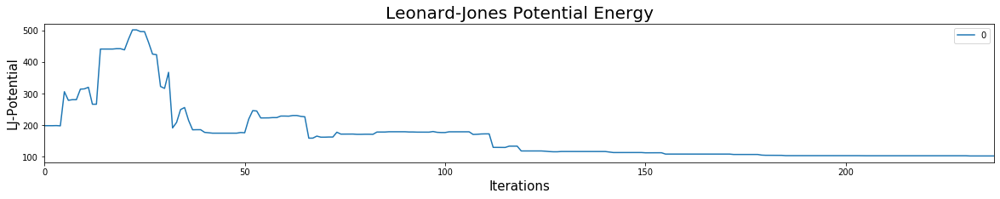

In [11]:
energy.plot(kind='line', figsize=(20,3))
plt.title('Leonard-Jones Potential Energy', fontsize = 20)
plt.ylabel('LJ-Potential', fontsize = 15)
plt.xlabel('Iterations', fontsize = 15)

Text(0.5, 0, 'Iterations')

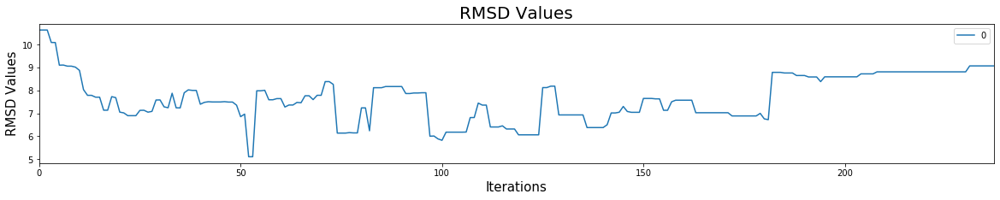

In [12]:
rmsd.plot(kind='line', figsize=(20,3))
plt.title('RMSD Values', fontsize = 20)
plt.ylabel('RMSD Values', fontsize = 15)
plt.xlabel('Iterations', fontsize = 15)

We can also look at a scatterplot showing the correlation between RMSD and LJ-potential values. If everything worked, we should see a correlation, the higher the energy, the higher the RMSD value should be.

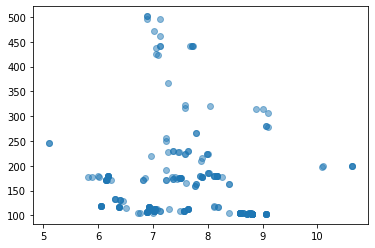

In [13]:
plt.scatter(rmsd, energy, alpha=0.5)

The peptide could not have folded correctly because the hyper parameters are not tuned right, thus I will next run a brute force search for better hyper parameters. The following arrays will contain all the temperatures and cooling rates that I will test.

In [14]:
# Set up hyperparameters to be searched
temperature_array = [100, 1000, 10000]
coolingRate_array = [0.01, 0.001, 0.0001]

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        # Set up lists to track the results
        energy_scores = []
        rmsd_scores = []

        temperature = temperature_array[i]
        coolingRate = coolingRate_array[j]
        expName = str(temperature) + "_" + str(coolingRate)
        names.append(expName)
        
        # Initialize the helix to have angles of 180 degrees again
        for k in range(helix.total_residue()):
            helix.set_phi(k + 1, 180)
            helix.set_psi(k + 1, 180)
            
        while temperature > 0.005: # this sets the minimum temperature
            helix = foldIt(helix, temperature)

            # reduce the temperature
            temperature = temperature * (1 - coolingRate)
            
        # Convert results into series so that they can be concatenated to a pandas dataframe
        energy_scores = pd.Series(energy_scores)
        rmsd_scores = pd.Series(rmsd_scores)

        # Concatenate results to a pandas dataframe
        energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
        rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

The following are plots showing the energy of the peptide as the simulation progresses. This simulation was still done with the LJ-potential scoring function. The temperature and cooling rate for each simulation are indicated at the top of the sub-figure.

Text(0.5, 0, 'Iterations')

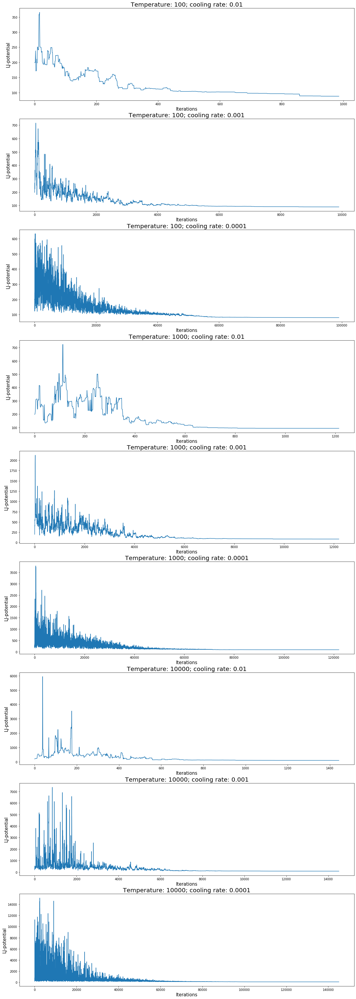

In [15]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(energy)), energy['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('LJ-potential', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('LJ-potential', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('LJ-potential', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('LJ-potential', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('LJ-potential', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('LJ-potential', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(energy)), energy['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('LJ-potential', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('LJ-potential', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('LJ-potential', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The final energies for each simulation are listed below:

In [16]:
print("Temperature: 100; cooling rate: 0.01-- ", energy['100_0.01'][energy['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", energy['100_0.001'][energy['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", energy['100_0.0001'][energy['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", energy['1000_0.01'][energy['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", energy['1000_0.001'][energy['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", energy['1000_0.0001'][energy['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", energy['10000_0.01'][energy['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", energy['10000_0.001'][energy['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", energy['10000_0.0001'][energy['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  87.87378030794952
Temperature: 100; cooling rate: 0.001--  89.27221713627517
Temperature: 100; cooling rate: 0.0001--  79.87771209293724
Temperature: 1000; cooling rate: 0.01--  93.21803656924072
Temperature: 1000; cooling rate: 0.001--  84.81843087289985
Temperature: 1000; cooling rate: 0.0001--  85.00002740327598
Temperature: 10000; cooling rate: 0.01--  89.87305471657594
Temperature: 10000; cooling rate: 0.001--  85.28233780180872
Temperature: 10000; cooling rate: 0.0001--  78.77701188152292


What follows are the RMSD plots:

Text(0.5, 0, 'Iterations')

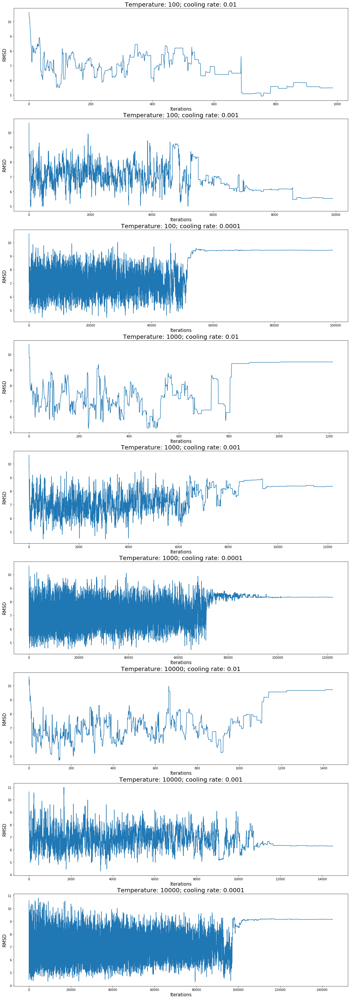

In [17]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(rmsd)), rmsd['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The final RMSD values are listed below:

In [18]:
print("Temperature: 100; cooling rate: 0.01-- ", rmsd['100_0.01'][rmsd['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", rmsd['100_0.001'][rmsd['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", rmsd['100_0.0001'][rmsd['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", rmsd['1000_0.01'][rmsd['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", rmsd['1000_0.001'][rmsd['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", rmsd['1000_0.0001'][rmsd['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", rmsd['10000_0.01'][rmsd['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", rmsd['10000_0.001'][rmsd['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", rmsd['10000_0.0001'][rmsd['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  5.482274532318115
Temperature: 100; cooling rate: 0.001--  5.527921676635742
Temperature: 100; cooling rate: 0.0001--  9.432808876037598
Temperature: 1000; cooling rate: 0.01--  9.511932373046875
Temperature: 1000; cooling rate: 0.001--  8.352056503295898
Temperature: 1000; cooling rate: 0.0001--  8.32882308959961
Temperature: 10000; cooling rate: 0.01--  9.708419799804688
Temperature: 10000; cooling rate: 0.001--  6.31527042388916
Temperature: 10000; cooling rate: 0.0001--  9.152443885803223


And finally, the following are the scatterplots showing the correlation between the energy and RMSD values for each hyperparameter pair.

Rows 1 - 3 correspond to temperatures 100, 1,000 and 10,000, while columns 1 - 3 correspond to cooling rates of 0.01, 0.001 and 0.0001. The first plot in row one and column one thus shows the simulation with the following hyperparameters: temperature 100 and cooling rate 0.01. 

<Figure size 432x288 with 0 Axes>

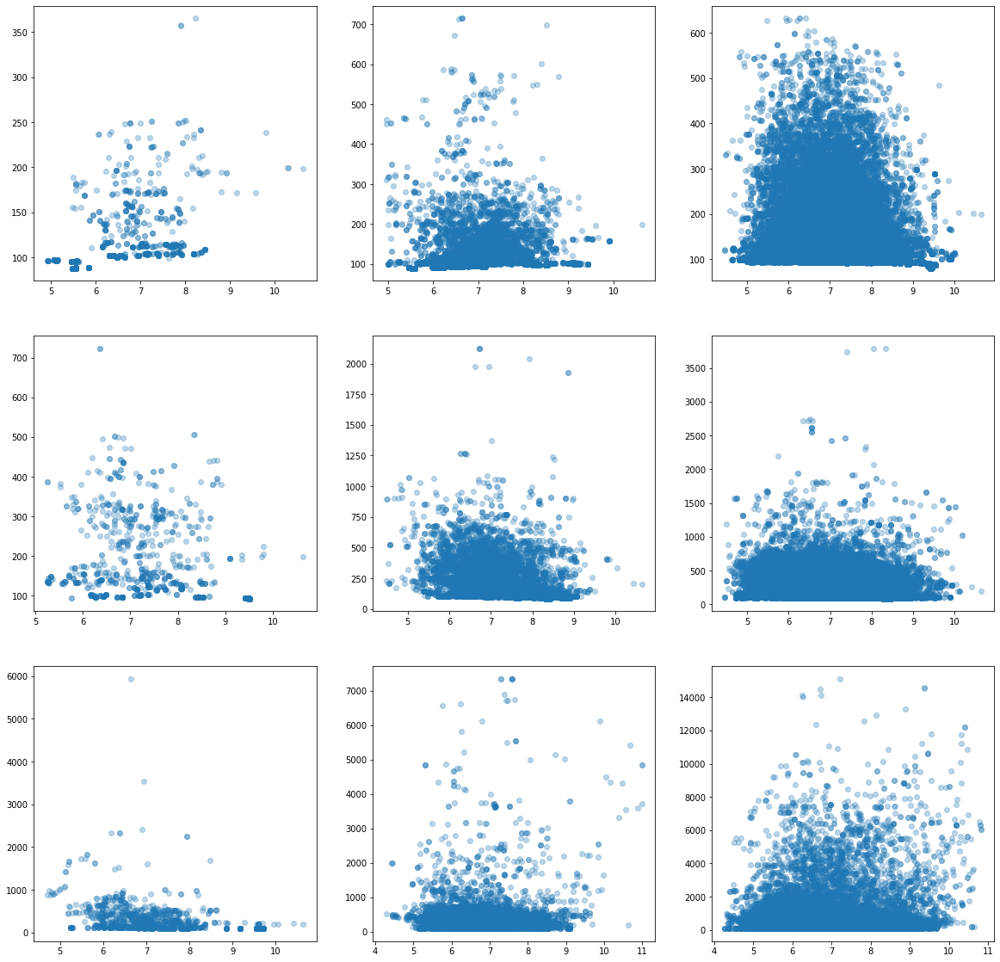

In [19]:
f = plt.figure()
f, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['100_0.01'], energy['100_0.01'], alpha = 0.3)
axes[0][1].scatter(rmsd['100_0.001'], energy['100_0.001'], alpha = 0.3)
axes[0][2].scatter(rmsd['100_0.0001'], energy['100_0.0001'], alpha = 0.3)
axes[1][0].scatter(rmsd['1000_0.01'], energy['1000_0.01'], alpha = 0.3)
axes[1][1].scatter(rmsd['1000_0.001'], energy['1000_0.001'], alpha = 0.3)
axes[1][2].scatter(rmsd['1000_0.0001'], energy['1000_0.0001'], alpha = 0.3)
axes[2][0].scatter(rmsd['10000_0.01'], energy['10000_0.01'], alpha = 0.3)
axes[2][1].scatter(rmsd['10000_0.001'], energy['10000_0.001'], alpha = 0.3)
axes[2][2].scatter(rmsd['10000_0.0001'], energy['10000_0.0001'], alpha = 0.3)
plt.show()

## New scoring: including hydrogen bonds

Clearly all of these simulations end up with final structures that not the original alpha-helix. Maybe a different scoring function will do better, this time I will include the backbone hydrogen bonds, as they are largely the ones involved in stabilizing alpha helices. I will also set the weight of this parameter fairly high (20) to ensure it has a big effect.

In [20]:
scorefxn = ScoreFunction()
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_atr, 1.0)
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_rep, 0.5)
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.hbond_sr_bb, 20)

basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/HBPoly1D.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/HBFadeIntervals.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/HBEval.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/DonStrength.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/AccStrength.csv


In [21]:
# Check the score of the folded protein with this new function
helix = pose_from_pdb("1gcn.pdb")
print(scorefxn.show(helix))

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.scoring.ScoreFunction: 
------------------------------------------------------------
 Scores                       Weight   Raw Score Wghtd.Score
------------------------------------------------------------
 fa_atr                       1.000     -62.918     -62.918
 fa_rep                       0.500      72.039      36.020
 hbond_sr_bb                 20.000      -3.319     -66.373
---------------------------------------------------
 Total weighted score:                      -93.271
None


Next I will try the exact same simulation as above including the brute force hyper-parameter search using the new scoring function that contains the backbone hydrogen component

In [22]:
# Set up hyperparameters to be searched
temperature_array = [100, 1000, 10000]
coolingRate_array = [0.01, 0.001, 0.0001]

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        # Set up lists to track the results
        energy_scores = []
        rmsd_scores = []

        temperature = temperature_array[i]
        coolingRate = coolingRate_array[j]
        expName = str(temperature) + "_" + str(coolingRate)
        names.append(expName)
        
        # Initialize the helix to have angles of 180 degrees again
        for k in range(helix.total_residue()):
            helix.set_phi(k + 1, 180)
            helix.set_psi(k + 1, 180)
            
        while temperature > 0.005: # this sets the minimum temperature
            helix = foldIt(helix, temperature)

            # reduce the temperature
            temperature = temperature * (1 - coolingRate)
            
        # Convert results into series so that they can be concatenated to a pandas dataframe
        energy_scores = pd.Series(energy_scores)
        rmsd_scores = pd.Series(rmsd_scores)

        # Concatenate results to a pandas dataframe
        energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
        rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

The following are the energy values for the simulation above.

Text(0.5, 0, 'Iterations')

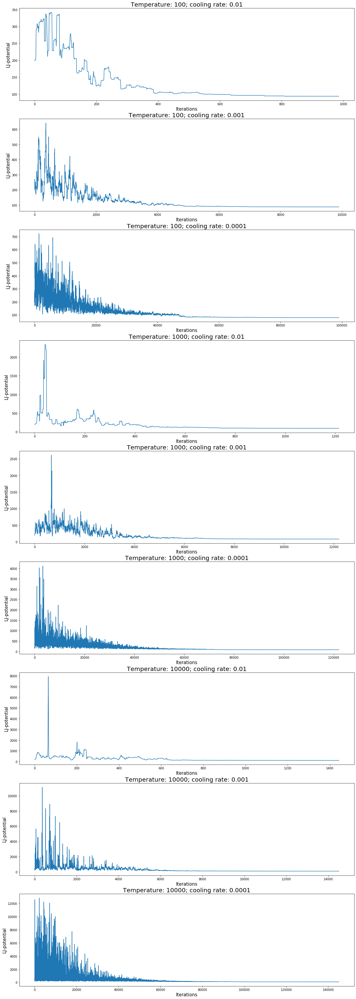

In [23]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(energy)), energy['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('LJ-potential', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('LJ-potential', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('LJ-potential', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('LJ-potential', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('LJ-potential', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('LJ-potential', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(energy)), energy['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('LJ-potential', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('LJ-potential', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('LJ-potential', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The following are the final energy values for each simulation

In [24]:
print("Temperature: 100; cooling rate: 0.01-- ", energy['100_0.01'][energy['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", energy['100_0.001'][energy['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", energy['100_0.0001'][energy['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", energy['1000_0.01'][energy['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", energy['1000_0.001'][energy['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", energy['1000_0.0001'][energy['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", energy['10000_0.01'][energy['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", energy['10000_0.001'][energy['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", energy['10000_0.0001'][energy['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  93.67603247276155
Temperature: 100; cooling rate: 0.001--  87.68262038498214
Temperature: 100; cooling rate: 0.0001--  79.4294071643923
Temperature: 1000; cooling rate: 0.01--  90.84347848548128
Temperature: 1000; cooling rate: 0.001--  85.9038015838918
Temperature: 1000; cooling rate: 0.0001--  78.35234128333423
Temperature: 10000; cooling rate: 0.01--  102.07781095166173
Temperature: 10000; cooling rate: 0.001--  86.91289731527104
Temperature: 10000; cooling rate: 0.0001--  70.62510771614033


The following are the RMSD values for the same simulation:

Text(0.5, 0, 'Iterations')

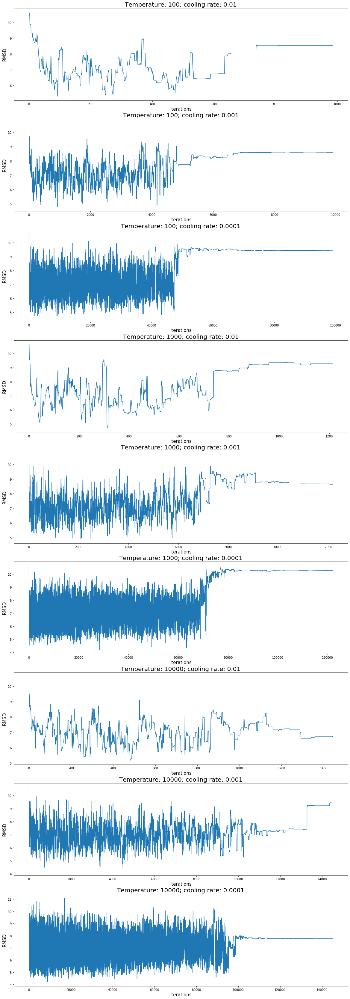

In [25]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(rmsd)), rmsd['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The following are the final RMSD values for each simulation

In [26]:
print("Temperature: 100; cooling rate: 0.01-- ", rmsd['100_0.01'][rmsd['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", rmsd['100_0.001'][rmsd['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", rmsd['100_0.0001'][rmsd['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", rmsd['1000_0.01'][rmsd['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", rmsd['1000_0.001'][rmsd['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", rmsd['1000_0.0001'][rmsd['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", rmsd['10000_0.01'][rmsd['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", rmsd['10000_0.001'][rmsd['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", rmsd['10000_0.0001'][rmsd['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  8.544203758239746
Temperature: 100; cooling rate: 0.001--  8.576704025268555
Temperature: 100; cooling rate: 0.0001--  9.448776245117188
Temperature: 1000; cooling rate: 0.01--  9.270675659179688
Temperature: 1000; cooling rate: 0.001--  8.636979103088379
Temperature: 1000; cooling rate: 0.0001--  10.278687477111816
Temperature: 10000; cooling rate: 0.01--  6.729424476623535
Temperature: 10000; cooling rate: 0.001--  9.509699821472168
Temperature: 10000; cooling rate: 0.0001--  7.756097316741943


And finally, the scatterplots. Each row and column still correspond to the same energy and cooling rate values.

<Figure size 432x288 with 0 Axes>

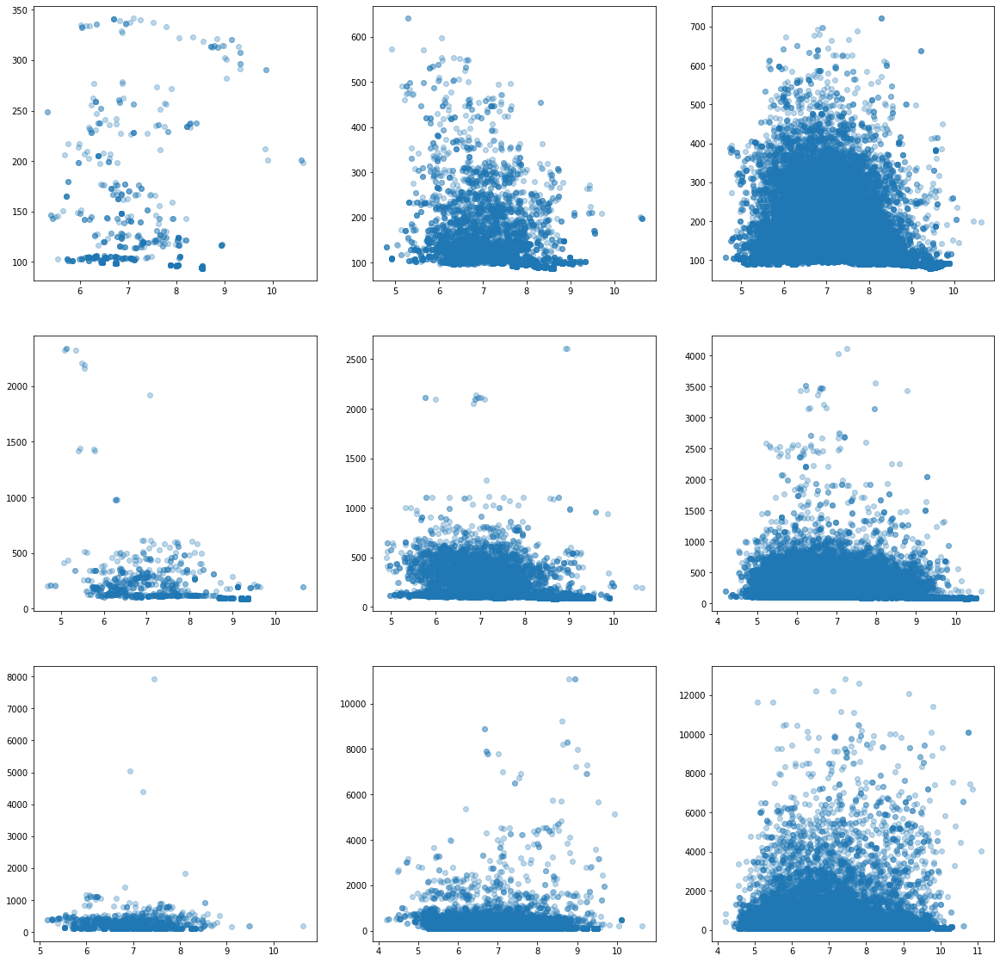

In [27]:
f = plt.figure()
f, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['100_0.01'], energy['100_0.01'], alpha = 0.3)
axes[0][1].scatter(rmsd['100_0.001'], energy['100_0.001'], alpha = 0.3)
axes[0][2].scatter(rmsd['100_0.0001'], energy['100_0.0001'], alpha = 0.3)
axes[1][0].scatter(rmsd['1000_0.01'], energy['1000_0.01'], alpha = 0.3)
axes[1][1].scatter(rmsd['1000_0.001'], energy['1000_0.001'], alpha = 0.3)
axes[1][2].scatter(rmsd['1000_0.0001'], energy['1000_0.0001'], alpha = 0.3)
axes[2][0].scatter(rmsd['10000_0.01'], energy['10000_0.01'], alpha = 0.3)
axes[2][1].scatter(rmsd['10000_0.001'], energy['10000_0.001'], alpha = 0.3)
axes[2][2].scatter(rmsd['10000_0.0001'], energy['10000_0.0001'], alpha = 0.3)
plt.show()

## Full scoring function 
Clearly adding the backbone hydrogen bond term to the energy function did not significantly improve the simulation results. Thus I will now use all of the parameters available through PyRosetta (with the exception of the dunbrack term, as this is for scoring the sidechaing which are in the original confirmation.

In [28]:
# set up the scoring function
scorefxn = get_fa_scorefxn()
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_dun, 0) # set the dunbrack term to zero

core.scoring.ScoreFunctionFactory: SCOREFUNCTION: ref2015
basic.io.database: Database file opened: scoring/score_functions/rama/fd/all.ramaProb
basic.io.database: Database file opened: scoring/score_functions/rama/fd/prepro.ramaProb
basic.io.database: Database file opened: scoring/score_functions/omega/omega_ppdep.all.txt
basic.io.database: Database file opened: scoring/score_functions/omega/omega_ppdep.gly.txt
basic.io.database: Database file opened: scoring/score_functions/omega/omega_ppdep.pro.txt
basic.io.database: Database file opened: scoring/score_functions/omega/omega_ppdep.valile.txt
basic.io.database: Database file opened: scoring/score_functions/P_AA_pp/P_AA
basic.io.database: Database file opened: scoring/score_functions/P_AA_pp/P_AA_n
core.scoring.P_AA: shapovalov_lib::shap_p_aa_pp_smooth_level of 1( aka low_smooth ) got activated.
basic.io.database: Database file opened: scoring/score_functions/P_AA_pp/shapovalov/10deg/kappa131/a20.prop


Find the total energy of the folded protein using this scoring function.

In [29]:
helix = pose_from_pdb("1gcn.pdb")
print(scorefxn.show(helix))

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
basic.io.database: Database file opened: scoring/score_functions/elec_cp_reps.dat
core.scoring.elec.util: Read 40 countpair representative atoms
core.scoring.ScoreFunction: 
------------------------------------------------------------
 Scores                       Weight   Raw Score Wghtd.Score
------------------------------------------------------------
 fa_atr                       1.000     -62.918     -62.918
 fa_rep                       0.550      72.039      39.622
 fa_sol                       1.000      55.171      55.171
 fa_intra_rep                 0.005      64.975       0.325
 fa_intra_sol_xover4          1.000       6.293       6.293
 lk_ball_wtd                  1.000      -2.112      -2.112
 fa_elec                      1.000      -3.714      -3.714
 pro_close                    1

Run the same simulation again with the same brute force hyper-parameter search.

In [30]:
# Set up hyperparameters to be searched
temperature_array = [100, 1000, 10000]
coolingRate_array = [0.01, 0.001, 0.0001]

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        # Set up lists to track the results
        energy_scores = []
        rmsd_scores = []

        temperature = temperature_array[i]
        coolingRate = coolingRate_array[j]
        expName = str(temperature) + "_" + str(coolingRate)
        names.append(expName)
        
        # Initialize the helix to have angles of 180 degrees again
        for k in range(helix.total_residue()):
            helix.set_phi(k + 1, 180)
            helix.set_psi(k + 1, 180)
            
        while temperature > 0.005: # this sets the minimum temperature
            helix = foldIt(helix, temperature)

            # reduce the temperature
            temperature = temperature * (1 - coolingRate)
            
        # Convert results into series so that they can be concatenated to a pandas dataframe
        energy_scores = pd.Series(energy_scores)
        rmsd_scores = pd.Series(rmsd_scores)

        # Concatenate results to a pandas dataframe
        energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
        rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

The following are the energies for the above simulation.

Text(0.5, 0, 'Iterations')

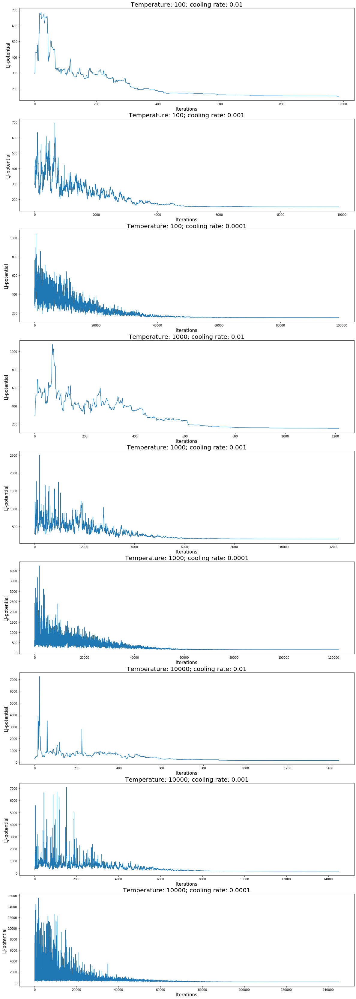

In [31]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(energy)), energy['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('LJ-potential', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('LJ-potential', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('LJ-potential', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('LJ-potential', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('LJ-potential', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('LJ-potential', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(energy)), energy['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('LJ-potential', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('LJ-potential', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('LJ-potential', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The following are the final values for the energy scores of the above simulation

In [32]:
print("Temperature: 100; cooling rate: 0.01-- ", energy['100_0.01'][energy['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", energy['100_0.001'][energy['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", energy['100_0.0001'][energy['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", energy['1000_0.01'][energy['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", energy['1000_0.001'][energy['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", energy['1000_0.0001'][energy['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", energy['10000_0.01'][energy['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", energy['10000_0.001'][energy['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", energy['10000_0.0001'][energy['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  152.51719358402696
Temperature: 100; cooling rate: 0.001--  150.9190840317987
Temperature: 100; cooling rate: 0.0001--  150.5545374473806
Temperature: 1000; cooling rate: 0.01--  152.29789541191488
Temperature: 1000; cooling rate: 0.001--  151.0650812634523
Temperature: 1000; cooling rate: 0.0001--  150.89397070762146
Temperature: 10000; cooling rate: 0.01--  155.1823734669585
Temperature: 10000; cooling rate: 0.001--  151.01760431986344
Temperature: 10000; cooling rate: 0.0001--  150.54198293741817


The following are the RMSD values corresponding to the above simulation.

Text(0.5, 0, 'Iterations')

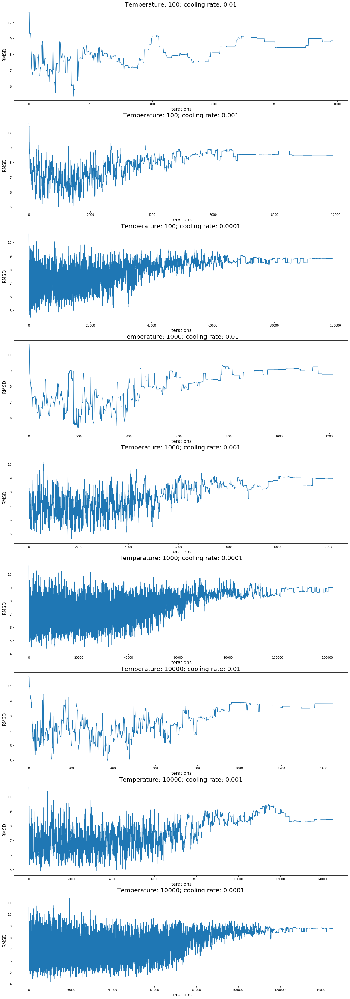

In [33]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(rmsd)), rmsd['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The following are the final RMSD scores for the above simulation

In [34]:
print("Temperature: 100; cooling rate: 0.01-- ", rmsd['100_0.01'][rmsd['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", rmsd['100_0.001'][rmsd['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", rmsd['100_0.0001'][rmsd['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", rmsd['1000_0.01'][rmsd['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", rmsd['1000_0.001'][rmsd['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", rmsd['1000_0.0001'][rmsd['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", rmsd['10000_0.01'][rmsd['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", rmsd['10000_0.001'][rmsd['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", rmsd['10000_0.0001'][rmsd['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  8.872621536254883
Temperature: 100; cooling rate: 0.001--  8.470620155334473
Temperature: 100; cooling rate: 0.0001--  8.816360473632812
Temperature: 1000; cooling rate: 0.01--  8.75068187713623
Temperature: 1000; cooling rate: 0.001--  8.959172248840332
Temperature: 1000; cooling rate: 0.0001--  8.98704719543457
Temperature: 10000; cooling rate: 0.01--  8.802657127380371
Temperature: 10000; cooling rate: 0.001--  8.414532661437988
Temperature: 10000; cooling rate: 0.0001--  8.772160530090332


The RMSD-energy scatterplots for the simulation above is shown below.

<Figure size 432x288 with 0 Axes>

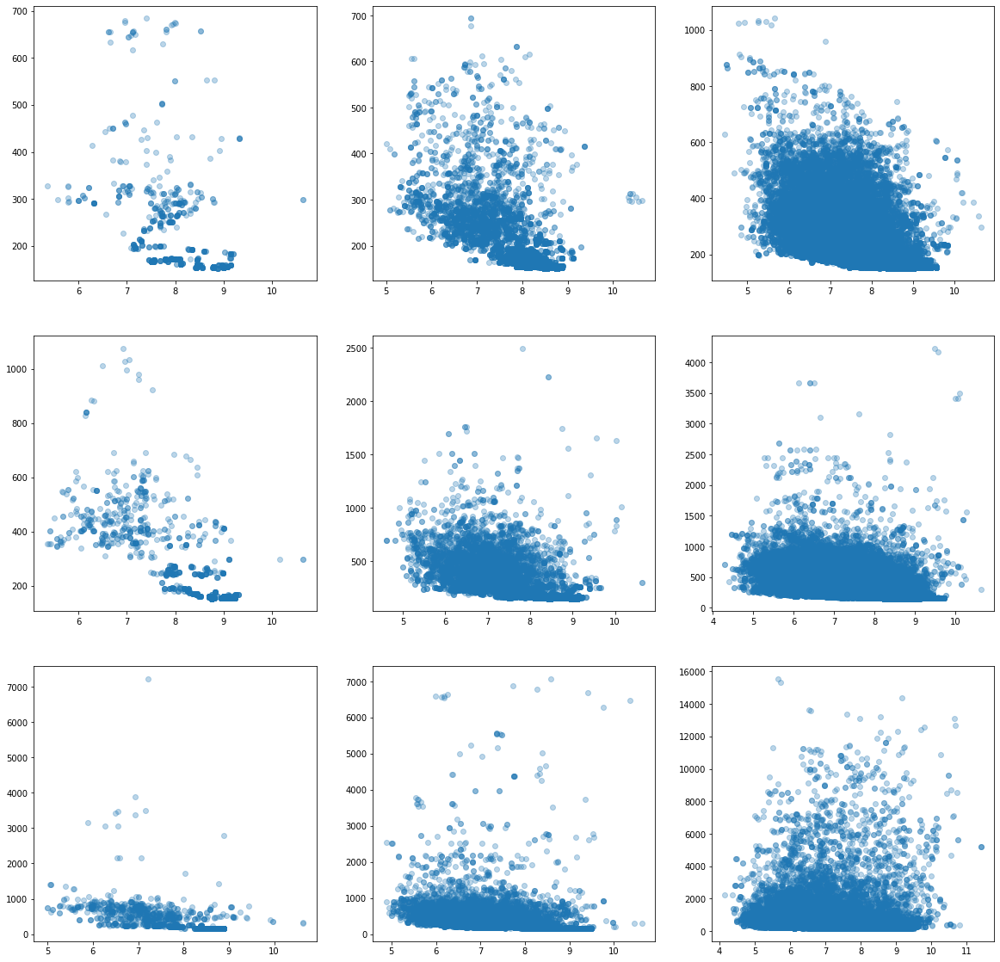

In [35]:
f = plt.figure()
f, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['100_0.01'], energy['100_0.01'], alpha = 0.3)
axes[0][1].scatter(rmsd['100_0.001'], energy['100_0.001'], alpha = 0.3)
axes[0][2].scatter(rmsd['100_0.0001'], energy['100_0.0001'], alpha = 0.3)
axes[1][0].scatter(rmsd['1000_0.01'], energy['1000_0.01'], alpha = 0.3)
axes[1][1].scatter(rmsd['1000_0.001'], energy['1000_0.001'], alpha = 0.3)
axes[1][2].scatter(rmsd['1000_0.0001'], energy['1000_0.0001'], alpha = 0.3)
axes[2][0].scatter(rmsd['10000_0.01'], energy['10000_0.01'], alpha = 0.3)
axes[2][1].scatter(rmsd['10000_0.001'], energy['10000_0.001'], alpha = 0.3)
axes[2][2].scatter(rmsd['10000_0.0001'], energy['10000_0.0001'], alpha = 0.3)
plt.show()

## Make the hydrogen bonds more important
Clearly both the energy values and the RMSD values are still far from the native structure. In the scoring function above I used the default weight for hydrogen bonds between atoms of the backbones. I will now try to use the exact same function but increase the weight of the backbone hydrogen bonds to 20. The dunbrack term will remain zero.

In [5]:
# Set up scoring function
scorefxn = get_fa_scorefxn()

scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_dun, 0) # Set dunbrack term to zero
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.hbond_sr_bb, 20) # Increase importance of the backbone h-bonds

core.scoring.ScoreFunctionFactory: SCOREFUNCTION: ref2015
core.scoring.etable: Starting energy table calculation
core.scoring.etable: smooth_etable: changing atr/rep split to bottom of energy well
core.scoring.etable: smooth_etable: spline smoothing lj etables (maxdis = 6)
core.scoring.etable: smooth_etable: spline smoothing solvation etables (max_dis = 6)
core.scoring.etable: Finished calculating energy tables.
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/HBPoly1D.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/HBFadeIntervals.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/HBEval.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/DonStrength.csv
basic.io.database: Database file opened: scoring/score_functions/hbonds/ref2015_params/AccStrength.csv
basic.io.database: Database file opened: scoring/score_functions/rama/fd/

In [6]:
# Find value of the native structure associated with this scoring function
helix = pose_from_pdb("1gcn.pdb")
print(scorefxn.show(helix))

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
basic.io.database: Database file opened: scoring/score_functions/elec_cp_reps.dat
core.scoring.elec.util: Read 40 countpair representative atoms
core.scoring.ScoreFunction: 
------------------------------------------------------------
 Scores                       Weight   Raw Score Wghtd.Score
------------------------------------------------------------
 fa_atr                       1.000     -62.918     -62.918
 fa_rep                       0.550      72.039      39.622
 fa_sol                       1.000      55.171      55.171
 fa_intra_rep                 0.005      64.975       0.325
 fa_intra_sol_xover4          1.000       6.293       6.293
 lk_ball_wtd                  1.000      -2.112      -2.112
 fa_elec                      1.000      -3.714      -3.714
 pro_close                    1

Run the same simulation as above with the same brute force hyper-parameter search.

In [38]:
# Set up hyperparameters to be searched
temperature_array = [100, 1000, 10000]
coolingRate_array = [0.01, 0.001, 0.0001]

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        # Set up lists to track the results
        energy_scores = []
        rmsd_scores = []

        temperature = temperature_array[i]
        coolingRate = coolingRate_array[j]
        expName = str(temperature) + "_" + str(coolingRate)
        names.append(expName)
        
        # Initialize the helix to have angles of 180 degrees again
        for k in range(helix.total_residue()):
            helix.set_phi(k + 1, 180)
            helix.set_psi(k + 1, 180)
            
        while temperature > 0.005: # this sets the minimum temperature
            helix = foldIt(helix, temperature)

            # reduce the temperature
            temperature = temperature * (1 - coolingRate)
            
        # Convert results into series so that they can be concatenated to a pandas dataframe
        energy_scores = pd.Series(energy_scores)
        rmsd_scores = pd.Series(rmsd_scores)

        # Concatenate results to a pandas dataframe
        energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
        rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

The energy plots for the above simulations:

Text(0.5, 0, 'Iterations')

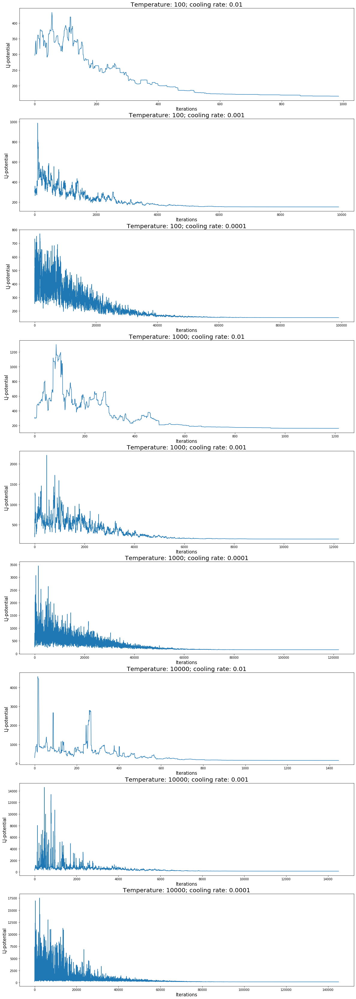

In [40]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(energy)), energy['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('LJ-potential', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('LJ-potential', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('LJ-potential', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('LJ-potential', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('LJ-potential', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('LJ-potential', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(energy)), energy['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('LJ-potential', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('LJ-potential', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('LJ-potential', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The final energy scores for each simulation are shown below:

In [39]:
print("Temperature: 100; cooling rate: 0.01-- ", energy['100_0.01'][energy['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", energy['100_0.001'][energy['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", energy['100_0.0001'][energy['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", energy['1000_0.01'][energy['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", energy['1000_0.001'][energy['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", energy['1000_0.0001'][energy['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", energy['10000_0.01'][energy['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", energy['10000_0.001'][energy['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", energy['10000_0.0001'][energy['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  166.22243630413388
Temperature: 100; cooling rate: 0.001--  151.15634910141642
Temperature: 100; cooling rate: 0.0001--  150.89137793209477
Temperature: 1000; cooling rate: 0.01--  159.42158075162575
Temperature: 1000; cooling rate: 0.001--  151.03706628993024
Temperature: 1000; cooling rate: 0.0001--  150.93414426285486
Temperature: 10000; cooling rate: 0.01--  155.34612123461596
Temperature: 10000; cooling rate: 0.001--  151.11505366201783
Temperature: 10000; cooling rate: 0.0001--  150.94052360858043


The final RMSD scores for each simulation are shown below:

Text(0.5, 0, 'Iterations')

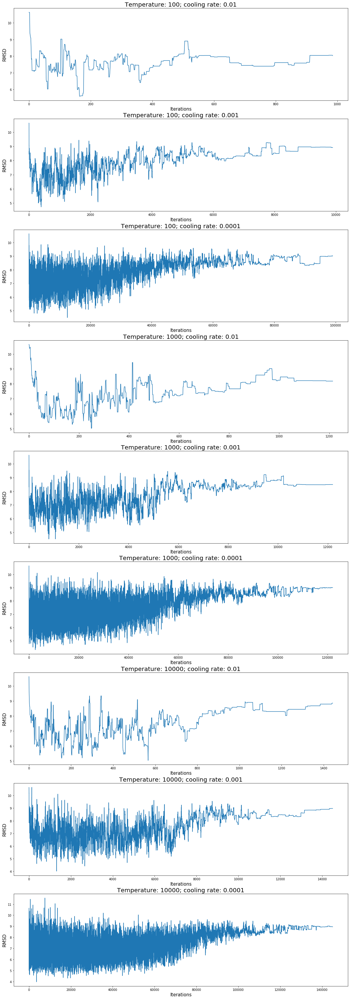

In [41]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, figsize=(20,60))

ax1.plot(range(len(rmsd)), rmsd['100_0.01'])
ax1.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15)
ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['100_0.001'])
ax2.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15)
ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['100_0.0001'])
ax3.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15)
ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['1000_0.01'])
ax4.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15)
ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['1000_0.001'])
ax5.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15)
ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['1000_0.0001'])
ax6.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15)
ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['10000_0.01'])
ax7.set_title('Temperature: 10000; cooling rate: 0.01', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15)
ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['10000_0.001'])
ax8.set_title('Temperature: 10000; cooling rate: 0.001', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15)
ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['10000_0.0001'])
ax9.set_title('Temperature: 10000; cooling rate: 0.0001', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15)
ax9.set_xlabel('Iterations', fontsize = 15)

The final RMSD values for each simulation are listed below:

In [42]:
print("Temperature: 100; cooling rate: 0.01-- ", rmsd['100_0.01'][rmsd['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001-- ", rmsd['100_0.001'][rmsd['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001-- ", rmsd['100_0.0001'][rmsd['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01-- ", rmsd['1000_0.01'][rmsd['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001-- ", rmsd['1000_0.001'][rmsd['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001-- ", rmsd['1000_0.0001'][rmsd['1000_0.0001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.01-- ", rmsd['10000_0.01'][rmsd['10000_0.01'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.001-- ", rmsd['10000_0.001'][rmsd['10000_0.001'].last_valid_index()])
print("Temperature: 10000; cooling rate: 0.0001-- ", rmsd['10000_0.0001'][rmsd['10000_0.0001'].last_valid_index()])

Temperature: 100; cooling rate: 0.01--  8.03150749206543
Temperature: 100; cooling rate: 0.001--  8.916722297668457
Temperature: 100; cooling rate: 0.0001--  9.014412879943848
Temperature: 1000; cooling rate: 0.01--  8.18188190460205
Temperature: 1000; cooling rate: 0.001--  8.493651390075684
Temperature: 1000; cooling rate: 0.0001--  9.005611419677734
Temperature: 10000; cooling rate: 0.01--  8.859899520874023
Temperature: 10000; cooling rate: 0.001--  8.97220516204834
Temperature: 10000; cooling rate: 0.0001--  8.958641052246094


RMSD-energy scatterplots for the above simulation

<Figure size 432x288 with 0 Axes>

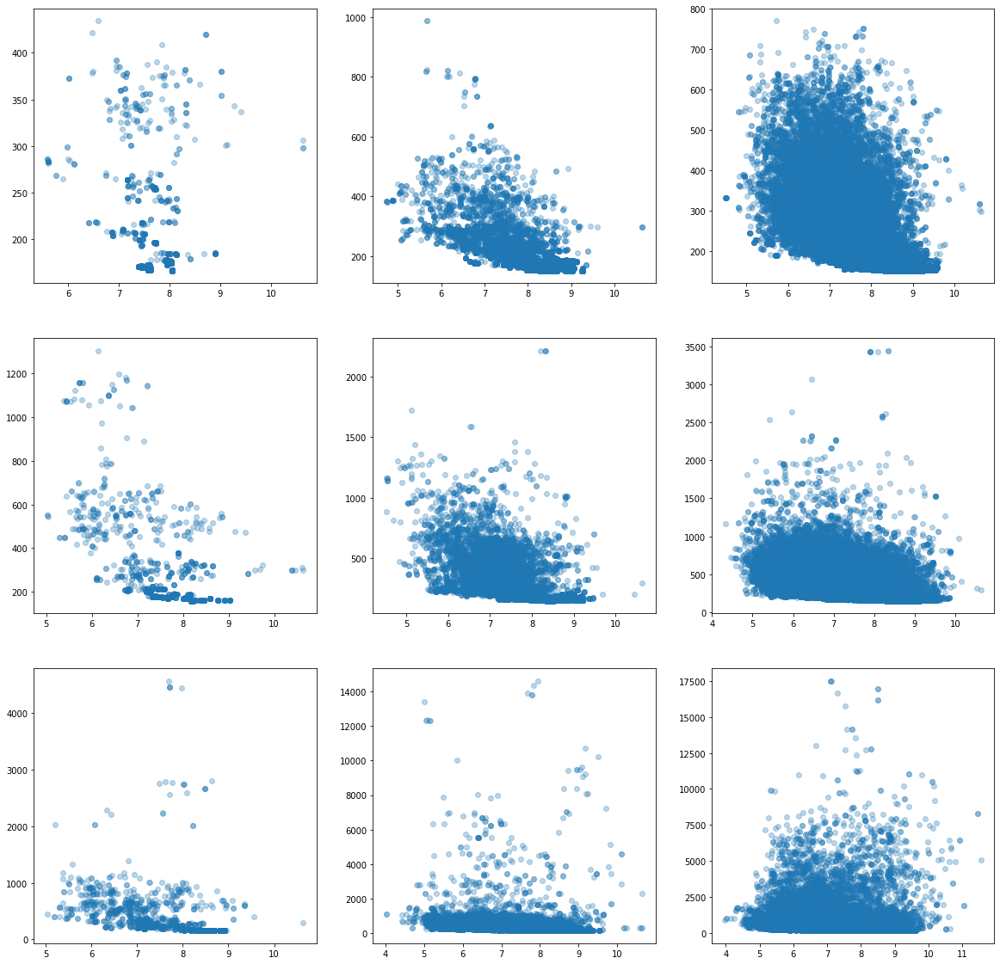

In [43]:
f = plt.figure()
f, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['100_0.01'], energy['100_0.01'], alpha = 0.3)
axes[0][1].scatter(rmsd['100_0.001'], energy['100_0.001'], alpha = 0.3)
axes[0][2].scatter(rmsd['100_0.0001'], energy['100_0.0001'], alpha = 0.3)
axes[1][0].scatter(rmsd['1000_0.01'], energy['1000_0.01'], alpha = 0.3)
axes[1][1].scatter(rmsd['1000_0.001'], energy['1000_0.001'], alpha = 0.3)
axes[1][2].scatter(rmsd['1000_0.0001'], energy['1000_0.0001'], alpha = 0.3)
axes[2][0].scatter(rmsd['10000_0.01'], energy['10000_0.01'], alpha = 0.3)
axes[2][1].scatter(rmsd['10000_0.001'], energy['10000_0.001'], alpha = 0.3)
axes[2][2].scatter(rmsd['10000_0.0001'], energy['10000_0.0001'], alpha = 0.3)
plt.show()

## Starting in the folded confirmation
So far, none of the methods have correctly folded the peptide. This could be because the folded conformation is in a narrow valley/hole in the multidimensional landscape we are dealing with. To get a better sense for this I will start at the correctly folded conformation, run the algorithm with different temperatures and cooling rates and visualize how hard it is to return to the original conformation.

In theory, this should make a few changes that increase the energy score but then reverse them and return to a conformation that is similar to the original one. 

In [42]:
# Load the original structure again
helix = pose_from_pdb("1gcn.pdb")
view = nv.show_rosetta(helix)
view

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18


NGLWidget()

<img src="files/alpha_helix_ribbon.png" style="height: 200px">

For this part I will use the same scoring function as above. (All PyRosetta parameters, no dunbrack term, and a weight of 20 for the backbone hydrogen bonds).

In [43]:
# Define the scoring function again
scorefxn = get_fa_scorefxn()
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.fa_dun, 0)
scorefxn.set_weight(pyrosetta.rosetta.core.scoring.ScoreType.hbond_sr_bb, 20)
print(scorefxn.show(helix))

core.scoring.ScoreFunctionFactory: SCOREFUNCTION: ref2015
core.scoring.ScoreFunction: 
------------------------------------------------------------
 Scores                       Weight   Raw Score Wghtd.Score
------------------------------------------------------------
 fa_atr                       1.000     -62.918     -62.918
 fa_rep                       0.550      72.039      39.622
 fa_sol                       1.000      55.171      55.171
 fa_intra_rep                 0.005      64.975       0.325
 fa_intra_sol_xover4          1.000       6.293       6.293
 lk_ball_wtd                  1.000      -2.112      -2.112
 fa_elec                      1.000      -3.714      -3.714
 pro_close                    1.250       0.000       0.000
 hbond_sr_bb                 20.000      -3.319     -66.373
 hbond_lr_bb                  1.000       0.000       0.000
 hbond_bb_sc                  1.000       0.000       0.000
 hbond_sc                     1.000       0.000       0.000
 dslf_fa13

In [46]:
# Set up hyperparameters to be searched
temperature_array = [0.1, 1, 10, 100, 1000]
coolingRate_array = [0.1, 0.01, 0.001, 0.0001]

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        # Set up lists to track the results
        energy_scores = []
        rmsd_scores = []

        temperature = temperature_array[i]
        coolingRate = coolingRate_array[j]
        expName = str(temperature) + "_" + str(coolingRate)
        names.append(expName)
        
        # Return to native structure
        helix = pose_from_pdb("1gcn.pdb")
            
        while temperature > 0.005: # this sets the minimum temperature
            helix = foldIt(helix, temperature)

            # reduce the temperature
            temperature = temperature * (1 - coolingRate)
            
        # Convert results into series so that they can be concatenated to a pandas dataframe
        energy_scores = pd.Series(energy_scores)
        rmsd_scores = pd.Series(rmsd_scores)

        # Concatenate results to a pandas dataframe
        energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
        rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn

Text(0.5, 0, 'Iterations')

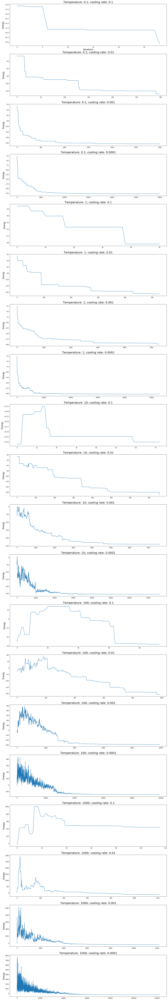

In [49]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16, ax17, ax18, ax19, ax20) = plt.subplots(20, 1, figsize=(20,130))
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(range(len(energy)), energy['0.1_0.1'])
ax1.set_title('Temperature: 0.1; cooling rate: 0.1', fontsize = 20)
ax1.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['0.1_0.01'])
ax2.set_title('Temperature: 0.1; cooling rate: 0.01', fontsize = 20)
ax2.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['0.1_0.001'])
ax3.set_title('Temperature: 0.1; cooling rate: 0.001', fontsize = 20)
ax3.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['0.1_0.0001'])
ax4.set_title('Temperature: 0.1; cooling rate: 0.0001', fontsize = 20)
ax4.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['1_0.1'])
ax5.set_title('Temperature: 1; cooling rate: 0.1', fontsize = 20)
ax5.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['1_0.01'])
ax6.set_title('Temperature: 1; cooling rate: 0.01', fontsize = 20)
ax6.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(energy)), energy['1_0.001'])
ax7.set_title('Temperature: 1; cooling rate: 0.001', fontsize = 20)
ax7.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['1_0.0001'])
ax8.set_title('Temperature: 1; cooling rate: 0.0001', fontsize = 20)
ax8.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['10_0.1'])
ax9.set_title('Temperature: 10; cooling rate: 0.1', fontsize = 20)
ax9.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax10.plot(range(len(energy)), energy['10_0.01'])
ax10.set_title('Temperature: 10; cooling rate: 0.01', fontsize = 20)
ax10.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax11.plot(range(len(energy)), energy['10_0.001'])
ax11.set_title('Temperature: 10; cooling rate: 0.001', fontsize = 20)
ax11.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax12.plot(range(len(energy)), energy['10_0.0001'])
ax12.set_title('Temperature: 10; cooling rate: 0.0001', fontsize = 20)
ax12.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax13.plot(range(len(energy)), energy['100_0.1'])
ax13.set_title('Temperature: 100; cooling rate: 0.1', fontsize = 20)
ax13.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax14.plot(range(len(energy)), energy['100_0.01'])
ax14.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax14.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax15.plot(range(len(energy)), energy['100_0.001'])
ax15.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax15.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax16.plot(range(len(energy)), energy['100_0.0001'])
ax16.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax16.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax17.plot(range(len(energy)), energy['1000_0.1'])
ax17.set_title('Temperature: 1000; cooling rate: 0.1', fontsize = 20)
ax17.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax18.plot(range(len(energy)), energy['1000_0.01'])
ax18.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax18.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax19.plot(range(len(energy)), energy['1000_0.001'])
ax19.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax19.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax20.plot(range(len(energy)), energy['1000_0.0001'])
ax20.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax20.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

The final energies of each simulation are as follows:

In [50]:
# Final values for each simulation
print("Temperature: 0.1; cooling rate: 0.1", energy['0.1_0.1'][energy['0.1_0.1'].last_valid_index()])
print("Temperature: 0.1; cooling rate: 0.01", energy['0.1_0.01'][energy['0.1_0.01'].last_valid_index()])
print("Temperature: 0.1; cooling rate: 0.001", energy['0.1_0.001'][energy['0.1_0.001'].last_valid_index()])
print("Temperature: 0.1; cooling rate: 0.0001", energy['0.1_0.0001'][energy['0.1_0.0001'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.1", energy['1_0.1'][energy['1_0.1'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.01", energy['1_0.01'][energy['1_0.01'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001", energy['1_0.001'][energy['1_0.001'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.0001", energy['1_0.0001'][energy['1_0.0001'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.1", energy['10_0.1'][energy['10_0.1'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01", energy['10_0.01'][energy['10_0.01'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001", energy['10_0.001'][energy['10_0.001'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.0001", energy['10_0.0001'][energy['10_0.0001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.1", energy['100_0.1'][energy['100_0.1'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01", energy['100_0.01'][energy['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001", energy['100_0.001'][energy['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001", energy['100_0.0001'][energy['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.1", energy['1000_0.1'][energy['1000_0.1'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01", energy['1000_0.01'][energy['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001", energy['1000_0.001'][energy['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001", energy['1000_0.0001'][energy['1000_0.0001'].last_valid_index()])

Temperature: 0.1; cooling rate: 0.1 -45.874842518061726
Temperature: 0.1; cooling rate: 0.01 -127.48307936380755
Temperature: 0.1; cooling rate: 0.001 -163.00987996950113
Temperature: 0.1; cooling rate: 0.0001 -228.31636571304398
Temperature: 1; cooling rate: 0.1 -81.90613783802806
Temperature: 1; cooling rate: 0.01 -145.85549172819438
Temperature: 1; cooling rate: 0.001 -197.8244885964
Temperature: 1; cooling rate: 0.0001 -202.63870515289557
Temperature: 10; cooling rate: 0.1 -25.50720097184072
Temperature: 10; cooling rate: 0.01 -167.33565992873105
Temperature: 10; cooling rate: 0.001 -239.4714724087271
Temperature: 10; cooling rate: 0.0001 -254.52013147203812
Temperature: 100; cooling rate: 0.1 -28.125104372231537
Temperature: 100; cooling rate: 0.01 -205.70026381992005
Temperature: 100; cooling rate: 0.001 -288.64579272399504
Temperature: 100; cooling rate: 0.0001 -290.65653578155275
Temperature: 1000; cooling rate: 0.1 441.2205593176057
Temperature: 1000; cooling rate: 0.01 -142.1

The following are the simulations RMSD values

Text(0.5, 0, 'Iterations')

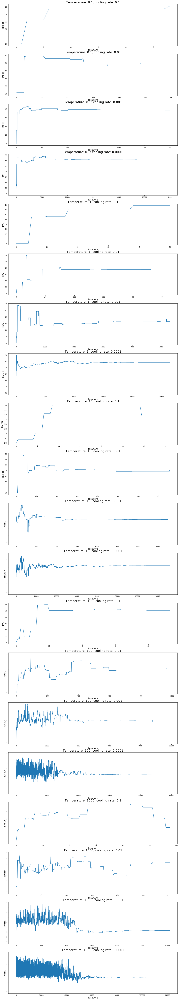

In [56]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16, ax17, ax18, ax19, ax20) = plt.subplots(20, 1, figsize=(20,120))
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(range(len(rmsd)), rmsd['0.1_0.1'])
ax1.set_title('Temperature: 0.1; cooling rate: 0.1', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['0.1_0.01'])
ax2.set_title('Temperature: 0.1; cooling rate: 0.01', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15); ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['0.1_0.001'])
ax3.set_title('Temperature: 0.1; cooling rate: 0.001', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15); ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['0.1_0.0001'])
ax4.set_title('Temperature: 0.1; cooling rate: 0.0001', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15); ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['1_0.1'])
ax5.set_title('Temperature: 1; cooling rate: 0.1', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15); ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['1_0.01'])
ax6.set_title('Temperature: 1; cooling rate: 0.01', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15); ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['1_0.001'])
ax7.set_title('Temperature: 1; cooling rate: 0.001', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15); ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['1_0.0001'])
ax8.set_title('Temperature: 1; cooling rate: 0.0001', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15); ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['10_0.1'])
ax9.set_title('Temperature: 10; cooling rate: 0.1', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15); ax9.set_xlabel('Iterations', fontsize = 15)

ax10.plot(range(len(rmsd)), rmsd['10_0.01'])
ax10.set_title('Temperature: 10; cooling rate: 0.01', fontsize = 20)
ax10.set_ylabel('RMSD', fontsize = 15); ax10.set_xlabel('Iterations', fontsize = 15)

ax11.plot(range(len(rmsd)), rmsd['10_0.001'])
ax11.set_title('Temperature: 10; cooling rate: 0.001', fontsize = 20)
ax11.set_ylabel('RMSD', fontsize = 15); ax11.set_xlabel('Iterations', fontsize = 15)

ax12.plot(range(len(rmsd)), rmsd['10_0.0001'])
ax12.set_title('Temperature: 10; cooling rate: 0.0001', fontsize = 20)
ax12.set_ylabel('Energy', fontsize = 15); ax12.set_xlabel('Iterations', fontsize = 15)

ax13.plot(range(len(rmsd)), rmsd['100_0.1'])
ax13.set_title('Temperature: 100; cooling rate: 0.1', fontsize = 20)
ax13.set_ylabel('RMSD', fontsize = 15); ax13.set_xlabel('Iterations', fontsize = 15)

ax14.plot(range(len(rmsd)), rmsd['100_0.01'])
ax14.set_title('Temperature: 100; cooling rate: 0.01', fontsize = 20)
ax14.set_ylabel('RMSD', fontsize = 15); ax14.set_xlabel('Iterations', fontsize = 15)

ax15.plot(range(len(rmsd)), rmsd['100_0.001'])
ax15.set_title('Temperature: 100; cooling rate: 0.001', fontsize = 20)
ax15.set_ylabel('RMSD', fontsize = 15); ax15.set_xlabel('Iterations', fontsize = 15)

ax16.plot(range(len(rmsd)), rmsd['100_0.0001'])
ax16.set_title('Temperature: 100; cooling rate: 0.0001', fontsize = 20)
ax16.set_ylabel('RMSD', fontsize = 15); ax16.set_xlabel('Iterations', fontsize = 15)

ax17.plot(range(len(rmsd)), rmsd['1000_0.1'])
ax17.set_title('Temperature: 1000; cooling rate: 0.1', fontsize = 20)
ax17.set_ylabel('Energy', fontsize = 15); ax17.set_xlabel('Iterations', fontsize = 15)

ax18.plot(range(len(rmsd)), rmsd['1000_0.01'])
ax18.set_title('Temperature: 1000; cooling rate: 0.01', fontsize = 20)
ax18.set_ylabel('RMSD', fontsize = 15); ax18.set_xlabel('Iterations', fontsize = 15)

ax19.plot(range(len(rmsd)), rmsd['1000_0.001'])
ax19.set_title('Temperature: 1000; cooling rate: 0.001', fontsize = 20)
ax19.set_ylabel('RMSD', fontsize = 15); ax19.set_xlabel('Iterations', fontsize = 15)

ax20.plot(range(len(rmsd)), rmsd['1000_0.0001'])
ax20.set_title('Temperature: 1000; cooling rate: 0.0001', fontsize = 20)
ax20.set_ylabel('RMSD', fontsize = 15); ax20.set_xlabel('Iterations', fontsize = 15)

The final RMSD values are as follows

In [58]:
# Final values for each simulation
print("Temperature: 0.1; cooling rate: 0.1--", rmsd['0.1_0.1'][rmsd['0.1_0.1'].last_valid_index()])
print("Temperature: 0.1; cooling rate: 0.01--", rmsd['0.1_0.01'][rmsd['0.1_0.01'].last_valid_index()])
print("Temperature: 0.1; cooling rate: 0.00--", rmsd['0.1_0.001'][rmsd['0.1_0.001'].last_valid_index()])
print("Temperature: 0.1; cooling rate: 0.0001--", rmsd['0.1_0.0001'][rmsd['0.1_0.0001'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.1--", rmsd['1_0.1'][rmsd['1_0.1'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.01--", rmsd['1_0.01'][rmsd['1_0.01'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001--", rmsd['1_0.001'][rmsd['1_0.001'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.0001--", rmsd['1_0.0001'][rmsd['1_0.0001'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.1--", rmsd['10_0.1'][rmsd['10_0.1'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01--", rmsd['10_0.01'][rmsd['10_0.01'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001--", rmsd['10_0.001'][rmsd['10_0.001'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.0001--", rmsd['10_0.0001'][rmsd['10_0.0001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.1--", rmsd['100_0.1'][rmsd['100_0.1'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01--", rmsd['100_0.01'][rmsd['100_0.01'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001--", rmsd['100_0.001'][rmsd['100_0.001'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.0001--", rmsd['100_0.0001'][rmsd['100_0.0001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.1--", rmsd['1000_0.1'][rmsd['1000_0.1'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01--", rmsd['1000_0.01'][rmsd['1000_0.01'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001--", rmsd['1000_0.001'][rmsd['1000_0.001'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.0001--", rmsd['1000_0.0001'][rmsd['1000_0.0001'].last_valid_index()])

Temperature: 0.1; cooling rate: 0.1-- 0.5114850997924805
Temperature: 0.1; cooling rate: 0.01-- 2.006500482559204
Temperature: 0.1; cooling rate: 0.00-- 1.9136227369308472
Temperature: 0.1; cooling rate: 0.0001-- 3.1241278648376465
Temperature: 1; cooling rate: 0.1-- 1.5717092752456665
Temperature: 1; cooling rate: 0.01-- 1.8128557205200195
Temperature: 1; cooling rate: 0.001-- 1.6479628086090088
Temperature: 1; cooling rate: 0.0001-- 2.400735378265381
Temperature: 10; cooling rate: 0.1-- 0.2645759582519531
Temperature: 10; cooling rate: 0.01-- 2.0630528926849365
Temperature: 10; cooling rate: 0.001-- 3.2593884468078613
Temperature: 10; cooling rate: 0.0001-- 3.2122814655303955
Temperature: 100; cooling rate: 0.1-- 2.5264105796813965
Temperature: 100; cooling rate: 0.01-- 3.158205509185791
Temperature: 100; cooling rate: 0.001-- 3.644719123840332
Temperature: 100; cooling rate: 0.0001-- 3.6929128170013428
Temperature: 1000; cooling rate: 0.1-- 1.8762083053588867
Temperature: 1000; cool

Scatterplots for RMSD and energy values. Columns and rows still represent different cooling rates and temperatures.

<Figure size 432x288 with 0 Axes>

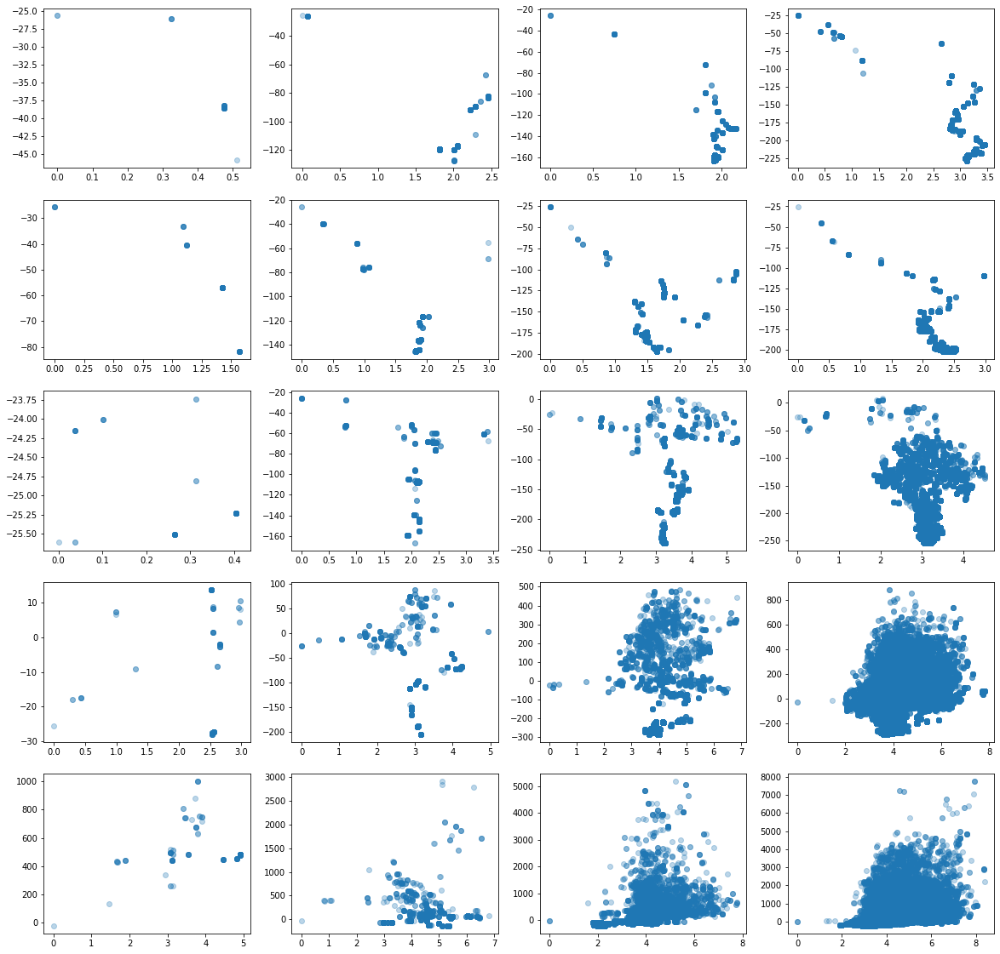

In [54]:
f = plt.figure()
f, axes = plt.subplots(nrows = 5, ncols = 4, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['0.1_0.1'], energy['0.1_0.1'], alpha = 0.3)
axes[0][1].scatter(rmsd['0.1_0.01'], energy['0.1_0.01'], alpha = 0.3)
axes[0][2].scatter(rmsd['0.1_0.001'], energy['0.1_0.001'], alpha = 0.3)
axes[0][3].scatter(rmsd['0.1_0.0001'], energy['0.1_0.0001'], alpha = 0.3)
axes[1][0].scatter(rmsd['1_0.1'], energy['1_0.1'], alpha = 0.3)
axes[1][1].scatter(rmsd['1_0.01'], energy['1_0.01'], alpha = 0.3)
axes[1][2].scatter(rmsd['1_0.001'], energy['1_0.001'], alpha = 0.3)
axes[1][3].scatter(rmsd['1_0.0001'], energy['1_0.0001'], alpha = 0.3)
axes[2][0].scatter(rmsd['10_0.1'], energy['10_0.1'], alpha = 0.3)
axes[2][1].scatter(rmsd['10_0.01'], energy['10_0.01'], alpha = 0.3)
axes[2][2].scatter(rmsd['10_0.001'], energy['10_0.001'], alpha = 0.3)
axes[2][3].scatter(rmsd['10_0.0001'], energy['10_0.0001'], alpha = 0.3)
axes[3][0].scatter(rmsd['100_0.1'], energy['100_0.1'], alpha = 0.3)
axes[3][1].scatter(rmsd['100_0.01'], energy['100_0.01'], alpha = 0.3)
axes[3][2].scatter(rmsd['100_0.001'], energy['100_0.001'], alpha = 0.3)
axes[3][3].scatter(rmsd['100_0.0001'], energy['100_0.0001'], alpha = 0.3)
axes[4][0].scatter(rmsd['1000_0.1'], energy['1000_0.1'], alpha = 0.3)
axes[4][1].scatter(rmsd['1000_0.01'], energy['1000_0.01'], alpha = 0.3)
axes[4][2].scatter(rmsd['1000_0.001'], energy['1000_0.001'], alpha = 0.3)
axes[4][3].scatter(rmsd['1000_0.0001'], energy['1000_0.0001'], alpha = 0.3)
plt.show()

Some of these simulations have RMSD values that are close to the native structure. Notably the simulation with a temperature of 10 and a cooling rate of 0.1 (RMSD 0.2 and an energy of -25), both of which are close to the native. However, some of these simulations with low energies and high cooling rates are to be interpreted cautiously, as these simulations will go through few steps and thus naturally stay close to the native conformation.

We know that the fully changed conformation (all angles at 180 degrees) has an RMSD value of around 10. However, what is missing thus far is a sense for how much different an RMSD of 3 is from the native. To get a sense of this, what follows are several structures from simulations that started at the native. Each of these has a different temperature and cooling rate associated with it.

With a temperature of 0.1, a cooling rate of 0.0001 we get an RMSD of 2.3:
<img src="files/folded_tem0.1_cooling0.0001_rmsd2.3.png" style="height: 200px">
Temperature of 10, cooling rate of 0.0001 we get an RMSD of 3.1 (the first replicate):
<img src="files/folded_tem10_cooling_0.0001_rmsd3.1.png" style="height: 200px">
The second replicate with the same parameters get us an RMSD of 3.3:
<img src="folded_tem10_cooling_0.0001_rmsd3.3.png" style="height: 200px">
Temperature of 100, cooling rate of 0.001 gets us an RMSD of 3.9 (the highest so far).
<img src="folded_tem100_cooling_0.001_rmsd3.9.png" style="height: 200px">
Increasing the temperature to 1000 results in an RMSD of 3.7:
<img src="folded_tem1000_cooling_0.001_rmsd3.7.png" style="height: 200px">
Increasing the temperature even further to 10,000 (without changing the cooling rate does not seem to have an effect on the RMSD/final structure. The following has an RMSD of 3.1):
<img src="folded_tem10000_cooling_0.001_rmsd3.1.png" style="height: 200px">

For the sake of comparison, starting the simulation at a conformation where all angles are set to 180 degrees returns the following result (RMSD of ~9):
<img src="unfolded_rmsd9.png" style="height: 200px">


#### The correct-ish conformation can clearly be reached with this objective function
This part of the analysis shows that a conformation that is close to the original alpha helix can be reached with this scoring function if one starts from the folded conformation. The big question is why this conformation is not reached when one starts in the unfolded conformation. This is the question the next section of the analysis will tackle.

## Making more conservative moves
One potential reason for the peptide not folding correctly could be that the moves the algorithm is making are too drastic (i.e. large deviations in agles change the conformation too much). Thus, this next section will repeat the monte carlo simulations above twice: once from the disordered state, and once from the native state.

To accomplish this I will find values for the new angles based on a normal distribution centered around the old agle. To prevent angles being set to values bigger than 360 degrees I will take the remainder of the new value after it is divided by 360. The following functions are written in such a way that the standard deviation associated with the normal distribution can be varied from simulation to simulation.

In [2]:
def changeConfirmation2(struc, sd):
    # Select a random residue in the structure
    res = random.randint(1, struc.total_residue() - 1)
    
    # this variable defines if the phi or the psi angle is being changed
    phi_or_psi = random.randint(0, 2)
    
    if phi_or_psi == 0:
        oldPhi = helix.phi(res)
        newPhi = np.random.normal(oldPhi, sd) % 360
        struc.set_phi(res + 1, newPhi)
        
    elif phi_or_psi == 1:
        oldPsi = helix.psi(res)
        newPsi = np.random.normal(oldPsi, sd) % 360
        struc.set_phi(res + 1, newPsi)
    else:
        oldPhi = helix.phi(res)
        newPhi = np.random.normal(oldPhi, sd) % 360
        
        oldPsi = helix.psi(res)
        newPsi = np.random.normal(oldPsi, sd) % 360

        struc.set_phi(res + 1, newPhi)
        struc.set_phi(res + 1, newPsi)
        
    score = scorefxn(helix)
    return(score)

def foldIt2(struc, temp, sd):
    # Get the current score
    current_score = scorefxn(struc)
    
    # Get the current rmsd value
    current_rmsd = pyrosetta.rosetta.core.scoring.CA_rmsd(native, helix)
    
    # append both to the respective dataframes
    energy_scores.append(current_score)
    rmsd_scores.append(current_rmsd)
    
    # Create a deepcopy permutation of the structure that I can then manipulate
    temp_helix = Pose()
    temp_helix.assign(struc)
    
    # Make a change to the temporary confirmation
    changeConfirmation2(temp_helix, sd)
    
    # Calculate the score of the new permutation
    new_score = scorefxn(temp_helix)
    
    # If the score is better accept the change
    if new_score < current_score:
        struc = temp_helix
    
    # If the score is worse only accept the change with a certain probability that is dependent on the magnitude of the 
    # change. I.e. a bigger change in energy makes it less likely to be accepted
    else:
        delta = abs(new_score - current_score)
        prob = math.exp(-delta/temperature)

        test_prob = random.uniform(0, 1)

        if(test_prob < prob):
            struc = temp_helix

    return(struc)

### Run the algorithm from the scrambled conformation
This section will run the folding simulation from the non-folded conformation and make small moves. The standard deviation will be varied from 2 to 15. The scoring function is identical to the one used earlier: all PyRosetta terms, except for the dunbrack term and the weight of the hydrogen bonds in the backbone is set to 20.

In [32]:
# Set up hyperparameters to be searched
temperature_array = [100, 1000]
coolingRate_array = [0.01, 0.001]
stdevs = [2, 5, 10, 15]

native = pose_from_pdb("1gcn.pdb")

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        for k in range(len(stdevs)):
            # Set up lists to track the results
            energy_scores = []
            rmsd_scores = []

            temperature = temperature_array[i]
            coolingRate = coolingRate_array[j]
            sd = stdevs[k]
            expName = str(temperature) + "_" + str(coolingRate) + "_" + str(sd)
            names.append(expName)

            # Initialize the helix to have angles of 180 degrees again
            for k in range(helix.total_residue()):
                helix.set_phi(k + 1, 180)
                helix.set_psi(k + 1, 180)

            while temperature > 0.005: # this sets the minimum temperature
                helix = foldIt2(helix, temperature, sd)

                # reduce the temperature
                temperature = temperature * (1 - coolingRate)

            # Convert results into series so that they can be concatenated to a pandas dataframe
            energy_scores = pd.Series(energy_scores)
            rmsd_scores = pd.Series(rmsd_scores)

            # Concatenate results to a pandas dataframe
            energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
            rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18


Text(0.5, 0, 'Iterations')

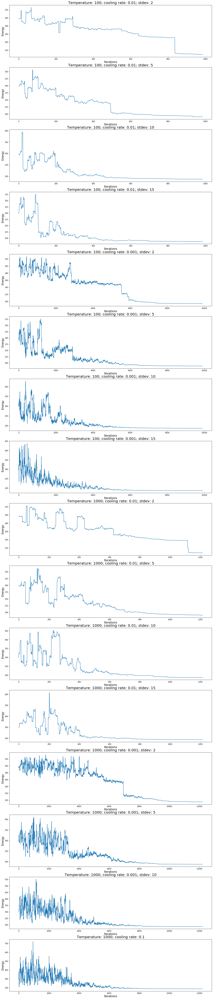

In [33]:
# THis is where the plotting for the above simulation needs to happen
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16) = plt.subplots(16, 1, figsize=(20,100))
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(range(len(energy)), energy['100_0.01_2'])
ax1.set_title('Temperature: 100; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax1.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['100_0.01_5'])
ax2.set_title('Temperature: 100; cooling rate: 0.01; stdev: 5', fontsize = 20)
ax2.set_ylabel('Energy', fontsize = 15); ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['100_0.01_10'])
ax3.set_title('Temperature: 100; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax3.set_ylabel('Energy', fontsize = 15); ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['100_0.01_15'])
ax4.set_title('Temperature: 100; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax4.set_ylabel('Energy', fontsize = 15); ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['100_0.001_2'])
ax5.set_title('Temperature: 100; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax5.set_ylabel('Energy', fontsize = 15); ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['100_0.001_5'])
ax6.set_title('Temperature: 100; cooling rate: 0.001; stdev: 5', fontsize = 20)
ax6.set_ylabel('Energy', fontsize = 15); ax6.set_xlabel('Iterations', fontsize = 15) 

ax7.plot(range(len(energy)), energy['100_0.001_10'])
ax7.set_title('Temperature: 100; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax7.set_ylabel('Energy', fontsize = 15); ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['100_0.001_15'])
ax8.set_title('Temperature: 100; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax8.set_ylabel('Energy', fontsize = 15); ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['1000_0.01_2'])
ax9.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax9.set_ylabel('Energy', fontsize = 15); ax9.set_xlabel('Iterations', fontsize = 15)

ax10.plot(range(len(energy)), energy['1000_0.01_5'])
ax10.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 5', fontsize = 20)
ax10.set_ylabel('Energy', fontsize = 15); ax10.set_xlabel('Iterations', fontsize = 15)

ax11.plot(range(len(energy)), energy['1000_0.01_10'])
ax11.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax11.set_ylabel('Energy', fontsize = 15); ax11.set_xlabel('Iterations', fontsize = 15)

ax12.plot(range(len(energy)), energy['1000_0.01_15'])
ax12.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax12.set_ylabel('Energy', fontsize = 15); ax12.set_xlabel('Iterations', fontsize = 15)

ax13.plot(range(len(energy)), energy['1000_0.001_2'])
ax13.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax13.set_ylabel('Energy', fontsize = 15); ax13.set_xlabel('Iterations', fontsize = 15)

ax14.plot(range(len(energy)), energy['1000_0.001_5'])
ax14.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 5', fontsize = 20)
ax14.set_ylabel('Energy', fontsize = 15); ax14.set_xlabel('Iterations', fontsize = 15)

ax15.plot(range(len(energy)), energy['1000_0.001_10'])
ax15.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax15.set_ylabel('Energy', fontsize = 15); ax15.set_xlabel('Iterations', fontsize = 15)

ax16.plot(range(len(energy)), energy['1000_0.001_15'])
ax16.set_title('Temperature: 1000; cooling rate: 0.1', fontsize = 20)
ax16.set_ylabel('Energy', fontsize = 15); ax16.set_xlabel('Iterations', fontsize = 15)

Energies at the end of the simulations

In [34]:
# Final values for each simulation
print("Temperature: 100; cooling rate: 0.01; stdev: 2-- ", energy['100_0.01_2'][energy['100_0.01_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 5-- ", energy['100_0.01_5'][energy['100_0.01_5'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 10-- ", energy['100_0.01_10'][energy['100_0.01_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 15-- ", energy['100_0.01_15'][energy['100_0.01_15'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 2-- ", energy['100_0.001_2'][energy['100_0.001_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 5-- ", energy['100_0.001_5'][energy['100_0.001_5'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 10-- ", energy['100_0.001_10'][energy['100_0.001_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 15-- ", energy['100_0.001_15'][energy['100_0.001_15'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 2-- ", energy['1000_0.01_2'][energy['1000_0.01_2'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 5-- ", energy['1000_0.01_5'][energy['1000_0.01_5'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 10-- ", energy['1000_0.01_10'][energy['1000_0.01_10'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 15-- ", energy['1000_0.01_15'][energy['1000_0.01_15'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 2-- ", energy['1000_0.001_2'][energy['1000_0.001_2'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 5-- ", energy['1000_0.001_5'][energy['1000_0.001_5'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 10-- ", energy['1000_0.001_10'][energy['1000_0.001_10'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 15-- ", energy['1000_0.001_15'][energy['1000_0.001_15'].last_valid_index()])

Temperature: 100; cooling rate: 0.01; stdev: 2--  209.04561868341972
Temperature: 100; cooling rate: 0.01; stdev: 5--  190.03285623234495
Temperature: 100; cooling rate: 0.01; stdev: 10--  187.0399564760661
Temperature: 100; cooling rate: 0.01; stdev: 15--  187.0762624248079
Temperature: 100; cooling rate: 0.001; stdev: 2--  193.44773108982838
Temperature: 100; cooling rate: 0.001; stdev: 5--  187.97575408974635
Temperature: 100; cooling rate: 0.001; stdev: 10--  186.7975699218769
Temperature: 100; cooling rate: 0.001; stdev: 15--  186.5174138525131
Temperature: 1000; cooling rate: 0.01; stdev: 2--  207.92348685910844
Temperature: 1000; cooling rate: 0.01; stdev: 5--  190.0745397440737
Temperature: 1000; cooling rate: 0.01; stdev: 10--  187.042705984264
Temperature: 1000; cooling rate: 0.01; stdev: 15--  187.16454303740136
Temperature: 1000; cooling rate: 0.001; stdev: 2--  194.66292728540168
Temperature: 1000; cooling rate: 0.001; stdev: 5--  187.83636487769672
Temperature: 1000; cool

RMSD values

Text(0.5, 0, 'Iterations')

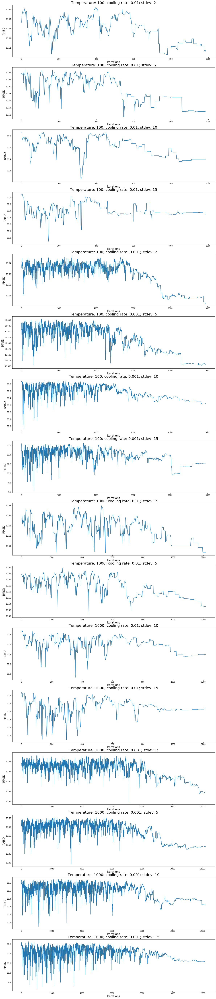

In [35]:
# THis is where the plotting for the above simulation needs to happen
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16) = plt.subplots(16, 1, figsize=(20,100))
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(range(len(rmsd)), rmsd['100_0.01_2'])
ax1.set_title('Temperature: 100; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['100_0.01_5'])
ax2.set_title('Temperature: 100; cooling rate: 0.01; stdev: 5', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15); ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['100_0.01_10'])
ax3.set_title('Temperature: 100; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15); ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['100_0.01_15'])
ax4.set_title('Temperature: 100; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15); ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['100_0.001_2'])
ax5.set_title('Temperature: 100; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15); ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['100_0.001_5'])
ax6.set_title('Temperature: 100; cooling rate: 0.001; stdev: 5', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15); ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['100_0.001_10'])
ax7.set_title('Temperature: 100; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15); ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['100_0.001_15'])
ax8.set_title('Temperature: 100; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15); ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['1000_0.01_2'])
ax9.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15); ax9.set_xlabel('Iterations', fontsize = 15)

ax10.plot(range(len(rmsd)), rmsd['1000_0.01_5'])
ax10.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 5', fontsize = 20)
ax10.set_ylabel('RMSD', fontsize = 15); ax10.set_xlabel('Iterations', fontsize = 15)

ax11.plot(range(len(rmsd)), rmsd['1000_0.01_10'])
ax11.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax11.set_ylabel('RMSD', fontsize = 15); ax11.set_xlabel('Iterations', fontsize = 15)

ax12.plot(range(len(rmsd)), rmsd['1000_0.01_15'])
ax12.set_title('Temperature: 1000; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax12.set_ylabel('RMSD', fontsize = 15); ax12.set_xlabel('Iterations', fontsize = 15)

ax13.plot(range(len(rmsd)), rmsd['1000_0.001_2'])
ax13.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax13.set_ylabel('RMSD', fontsize = 15); ax13.set_xlabel('Iterations', fontsize = 15)

ax14.plot(range(len(rmsd)), rmsd['1000_0.001_5'])
ax14.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 5', fontsize = 20)
ax14.set_ylabel('RMSD', fontsize = 15); ax14.set_xlabel('Iterations', fontsize = 15)

ax15.plot(range(len(rmsd)), rmsd['1000_0.001_10'])
ax15.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax15.set_ylabel('RMSD', fontsize = 15); ax15.set_xlabel('Iterations', fontsize = 15)

ax16.plot(range(len(rmsd)), rmsd['1000_0.001_15'])
ax16.set_title('Temperature: 1000; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax16.set_ylabel('RMSD', fontsize = 15); ax16.set_xlabel('Iterations', fontsize = 15)

Final RMSD values:

In [36]:
# Final values for each simulation
print("Temperature: 100; cooling rate: 0.01; stdev: 2-- ", rmsd['100_0.01_2'][rmsd['100_0.01_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 5-- ", rmsd['100_0.01_5'][rmsd['100_0.01_5'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 10-- ", rmsd['100_0.01_10'][rmsd['100_0.01_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 15-- ", rmsd['100_0.01_15'][rmsd['100_0.01_15'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 2-- ", rmsd['100_0.001_2'][rmsd['100_0.001_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 5-- ", rmsd['100_0.001_5'][rmsd['100_0.001_5'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 10-- ", rmsd['100_0.001_10'][rmsd['100_0.001_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 15-- ", rmsd['100_0.001_15'][rmsd['100_0.001_15'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 2-- ", rmsd['1000_0.01_2'][rmsd['1000_0.01_2'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 5-- ", rmsd['1000_0.01_5'][rmsd['1000_0.01_5'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 10-- ", rmsd['1000_0.01_10'][rmsd['1000_0.01_10'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.01; stdev: 15-- ", rmsd['1000_0.01_15'][rmsd['1000_0.01_15'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 2-- ", rmsd['1000_0.001_2'][rmsd['1000_0.001_2'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 5-- ", rmsd['1000_0.001_5'][rmsd['1000_0.001_5'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 10-- ", rmsd['1000_0.001_10'][rmsd['1000_0.001_10'].last_valid_index()])
print("Temperature: 1000; cooling rate: 0.001; stdev: 15-- ", rmsd['1000_0.001_15'][rmsd['1000_0.001_15'].last_valid_index()])

Temperature: 100; cooling rate: 0.01; stdev: 2--  10.60636043548584
Temperature: 100; cooling rate: 0.01; stdev: 5--  10.530750274658203
Temperature: 100; cooling rate: 0.01; stdev: 10--  10.399333953857422
Temperature: 100; cooling rate: 0.01; stdev: 15--  10.350260734558105
Temperature: 100; cooling rate: 0.001; stdev: 2--  10.56515121459961
Temperature: 100; cooling rate: 0.001; stdev: 5--  10.458137512207031
Temperature: 100; cooling rate: 0.001; stdev: 10--  10.32150650024414
Temperature: 100; cooling rate: 0.001; stdev: 15--  10.215607643127441
Temperature: 1000; cooling rate: 0.01; stdev: 2--  10.603715896606445
Temperature: 1000; cooling rate: 0.01; stdev: 5--  10.53101634979248
Temperature: 1000; cooling rate: 0.01; stdev: 10--  10.397390365600586
Temperature: 1000; cooling rate: 0.01; stdev: 15--  10.44182014465332
Temperature: 1000; cooling rate: 0.001; stdev: 2--  10.57925033569336
Temperature: 1000; cooling rate: 0.001; stdev: 5--  10.490227699279785
Temperature: 1000; coo

<Figure size 432x288 with 0 Axes>

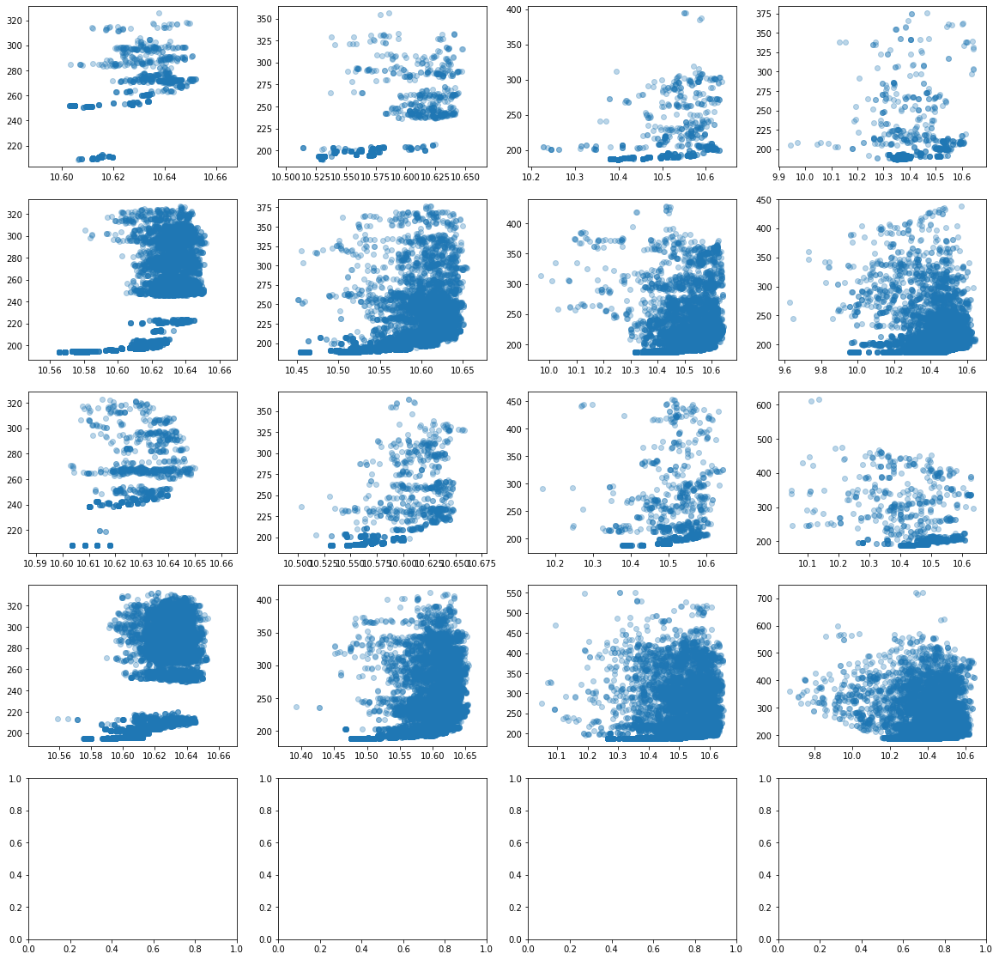

In [37]:
f = plt.figure()
f, axes = plt.subplots(nrows = 4, ncols = 4, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['100_0.01_2'], energy['100_0.01_2'], alpha = 0.3)
axes[0][1].scatter(rmsd['100_0.01_5'], energy['100_0.01_5'], alpha = 0.3)
axes[0][2].scatter(rmsd['100_0.01_10'], energy['100_0.01_10'], alpha = 0.3)
axes[0][3].scatter(rmsd['100_0.01_15'], energy['100_0.01_15'], alpha = 0.3)
axes[1][0].scatter(rmsd['100_0.001_2'], energy['100_0.001_2'], alpha = 0.3)
axes[1][1].scatter(rmsd['100_0.001_5'], energy['100_0.001_5'], alpha = 0.3)
axes[1][2].scatter(rmsd['100_0.001_10'], energy['100_0.001_10'], alpha = 0.3)
axes[1][3].scatter(rmsd['100_0.001_15'], energy['100_0.001_15'], alpha = 0.3)
axes[2][0].scatter(rmsd['1000_0.01_2'], energy['1000_0.01_2'], alpha = 0.3)
axes[2][1].scatter(rmsd['1000_0.01_5'], energy['1000_0.01_5'], alpha = 0.3)
axes[2][2].scatter(rmsd['1000_0.01_10'], energy['1000_0.01_10'], alpha = 0.3)
axes[2][3].scatter(rmsd['1000_0.01_15'], energy['1000_0.01_15'], alpha = 0.3)
axes[3][0].scatter(rmsd['1000_0.001_2'], energy['1000_0.001_2'], alpha = 0.3)
axes[3][1].scatter(rmsd['1000_0.001_5'], energy['1000_0.001_5'], alpha = 0.3)
axes[3][2].scatter(rmsd['1000_0.001_10'], energy['1000_0.001_10'], alpha = 0.3)
axes[3][3].scatter(rmsd['1000_0.001_15'], energy['1000_0.001_15'], alpha = 0.3)
plt.show()

Based on both the energy values as well as the RMSD values, we can see that making smaller moves is actually worse than making larger moves, as the final valus for both the energy and RMSD terms are higher than if random moves were made.

## Starting in the folded conformation
Next I will perform the same simulation as above, the only difference will be that I will start in the folded conformation. Small angles will be picked in the same way, and the same scoring function will be used.

In [20]:
# Set up hyperparameters to be searched
temperature_array = [1, 10, 100]
coolingRate_array = [0.01, 0.001]
stdevs = [2, 10, 15]

# And the corresponding data frames
energy = pd.DataFrame()
rmsd = pd.DataFrame()
names = [] # this will store the name of the experiment
    
for i in range(len(temperature_array)):
    for j in range(len(coolingRate_array)):
        for k in range(len(stdevs)):
            # Set up lists to track the results
            energy_scores = []
            rmsd_scores = []

            temperature = temperature_array[i]
            coolingRate = coolingRate_array[j]
            sd = stdevs[k]
            
            expName = str(temperature) + "_" + str(coolingRate) + "_" + str(sd)
            names.append(expName)

            # Return to native structure
            helix = pose_from_pdb("1gcn.pdb")

            while temperature > 0.005: # this sets the minimum temperature
                helix = foldIt2(helix, temperature, sd)

                # reduce the temperature
                temperature = temperature * (1 - coolingRate)

            # Convert results into series so that they can be concatenated to a pandas dataframe
            energy_scores = pd.Series(energy_scores)
            rmsd_scores = pd.Series(rmsd_scores)

            # Concatenate results to a pandas dataframe
            energy = pd.concat([energy, energy_scores], ignore_index = True, axis = 1)
            rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)

rmsd.columns = names
energy.columns = names

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.import_pose.import_pose: File '1gcn

Energy values for the above simulation

Text(0.5, 0, 'Iterations')

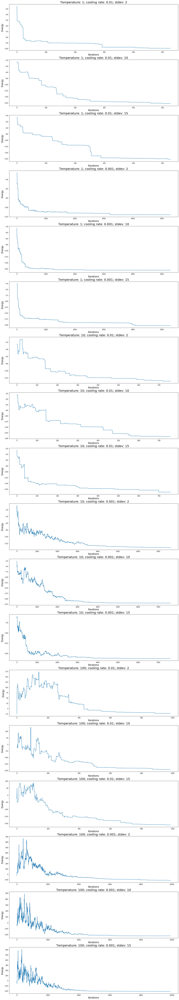

In [24]:
# THis is where the plotting for the above simulation needs to happen
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16, ax17, ax18) = plt.subplots(18, 1, figsize=(20,120))
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(range(len(energy)), energy['1_0.01_2'])
ax1.set_title('Temperature: 1; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax1.set_ylabel('Energy', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(energy)), energy['1_0.01_10'])
ax2.set_title('Temperature: 1; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax2.set_ylabel('Energy', fontsize = 15); ax2.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(energy)), energy['1_0.01_15'])
ax3.set_title('Temperature: 1; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax3.set_ylabel('Energy', fontsize = 15); ax3.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(energy)), energy['1_0.001_2'])
ax4.set_title('Temperature: 1; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax4.set_ylabel('Energy', fontsize = 15); ax4.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(energy)), energy['1_0.001_10'])
ax5.set_title('Temperature: 1; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax5.set_ylabel('Energy', fontsize = 15); ax5.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(energy)), energy['1_0.001_15'])
ax6.set_title('Temperature: 1; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax6.set_ylabel('Energy', fontsize = 15); ax6.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(energy)), energy['10_0.01_2'])
ax7.set_title('Temperature: 10; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax7.set_ylabel('Energy', fontsize = 15); ax7.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(energy)), energy['10_0.01_10'])
ax8.set_title('Temperature: 10; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax8.set_ylabel('Energy', fontsize = 15); ax8.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(energy)), energy['10_0.01_15'])
ax9.set_title('Temperature: 10; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax9.set_ylabel('Energy', fontsize = 15); ax9.set_xlabel('Iterations', fontsize = 15)

ax10.plot(range(len(energy)), energy['10_0.001_2'])
ax10.set_title('Temperature: 10; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax10.set_ylabel('Energy', fontsize = 15); ax10.set_xlabel('Iterations', fontsize = 15)

ax11.plot(range(len(energy)), energy['10_0.001_10'])
ax11.set_title('Temperature: 10; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax11.set_ylabel('Energy', fontsize = 15); ax11.set_xlabel('Iterations', fontsize = 15)

ax12.plot(range(len(energy)), energy['10_0.001_15'])
ax12.set_title('Temperature: 10; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax12.set_ylabel('Energy', fontsize = 15); ax12.set_xlabel('Iterations', fontsize = 15)

ax13.plot(range(len(energy)), energy['100_0.01_2'])
ax13.set_title('Temperature: 100; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax13.set_ylabel('Energy', fontsize = 15); ax13.set_xlabel('Iterations', fontsize = 15)

ax14.plot(range(len(energy)), energy['100_0.01_10'])
ax14.set_title('Temperature: 100; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax14.set_ylabel('Energy', fontsize = 15); ax14.set_xlabel('Iterations', fontsize = 15)

ax15.plot(range(len(energy)), energy['100_0.01_15'])
ax15.set_title('Temperature: 100; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax15.set_ylabel('Energy', fontsize = 15); ax15.set_xlabel('Iterations', fontsize = 15)

ax16.plot(range(len(energy)), energy['100_0.001_2'])
ax16.set_title('Temperature: 100; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax16.set_ylabel('Energy', fontsize = 15); ax16.set_xlabel('Iterations', fontsize = 15)

ax17.plot(range(len(energy)), energy['100_0.001_10'])
ax17.set_title('Temperature: 100; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax17.set_ylabel('Energy', fontsize = 15); ax17.set_xlabel('Iterations', fontsize = 15)

ax18.plot(range(len(energy)), energy['100_0.001_15'])
ax18.set_title('Temperature: 100; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax18.set_ylabel('Energy', fontsize = 15); ax18.set_xlabel('Iterations', fontsize = 15)

Final energy values for each simulation:

In [27]:
# Final values for each simulation
print("Temperature: 1; cooling rate: 0.01; stdev: 2-- ", energy['1_0.01_2'][energy['1_0.01_2'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.01; stdev: 10-- ", energy['1_0.01_10'][energy['1_0.01_10'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.01; stdev: 15-- ", energy['1_0.01_15'][energy['1_0.01_15'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001; stdev: 2-- ", energy['1_0.001_2'][energy['1_0.001_2'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001; stdev: 10-- ", energy['1_0.001_10'][energy['1_0.001_10'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001; stdev: 15-- ", energy['1_0.001_15'][energy['1_0.001_15'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01; stdev: 2-- ", energy['10_0.01_2'][energy['10_0.01_2'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01; stdev: 10-- ", energy['10_0.01_10'][energy['10_0.01_10'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01; stdev: 15-- ", energy['10_0.01_15'][energy['10_0.01_15'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001; stdev: 2-- ", energy['10_0.001_2'][energy['10_0.001_2'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001; stdev: 10-- ", energy['10_0.001_10'][energy['10_0.001_10'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001; stdev: 15-- ", energy['10_0.001_15'][energy['10_0.001_15'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 2-- ", energy['100_0.01_2'][energy['100_0.01_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 10-- ", energy['100_0.01_10'][energy['100_0.01_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 15-- ", energy['100_0.01_15'][energy['100_0.01_15'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 2-- ", energy['100_0.001_2'][energy['100_0.001_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 10-- ", energy['100_0.001_10'][energy['100_0.001_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 15-- ", energy['100_0.001_15'][energy['100_0.001_15'].last_valid_index()])

Temperature: 1; cooling rate: 0.01; stdev: 2--  -99.53529490475813
Temperature: 1; cooling rate: 0.01; stdev: 10--  -163.1131677439847
Temperature: 1; cooling rate: 0.01; stdev: 15--  -161.70795480478964
Temperature: 1; cooling rate: 0.001; stdev: 2--  -115.8717267489894
Temperature: 1; cooling rate: 0.001; stdev: 10--  -164.8765018624096
Temperature: 1; cooling rate: 0.001; stdev: 15--  -203.14926177494357
Temperature: 10; cooling rate: 0.01; stdev: 2--  -129.54710068362434
Temperature: 10; cooling rate: 0.01; stdev: 10--  -173.94125689447105
Temperature: 10; cooling rate: 0.01; stdev: 15--  -169.93671398677765
Temperature: 10; cooling rate: 0.001; stdev: 2--  -132.2711559034375
Temperature: 10; cooling rate: 0.001; stdev: 10--  -219.83405472585704
Temperature: 10; cooling rate: 0.001; stdev: 15--  -224.81787295110578
Temperature: 100; cooling rate: 0.01; stdev: 2--  -22.990285400625424
Temperature: 100; cooling rate: 0.01; stdev: 10--  -191.99008827285803
Temperature: 100; cooling ra

Text(0.5, 0, 'Iterations')

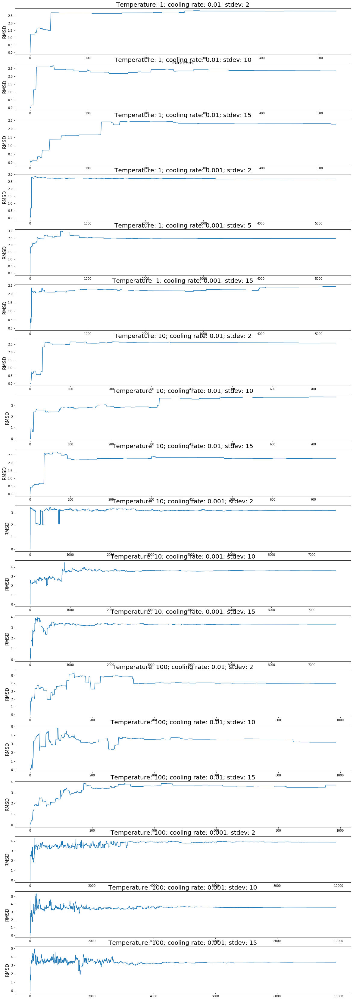

In [28]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16, ax17, ax18) = plt.subplots(18, 1, figsize=(20,60))
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(range(len(rmsd)), rmsd['1_0.01_2'])
ax1.set_title('Temperature: 1; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax1.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax2.plot(range(len(rmsd)), rmsd['1_0.01_10'])
ax2.set_title('Temperature: 1; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax2.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax3.plot(range(len(rmsd)), rmsd['1_0.01_15'])
ax3.set_title('Temperature: 1; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax3.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax4.plot(range(len(rmsd)), rmsd['1_0.001_2'])
ax4.set_title('Temperature: 1; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax4.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax5.plot(range(len(rmsd)), rmsd['1_0.001_10'])
ax5.set_title('Temperature: 1; cooling rate: 0.001; stdev: 5', fontsize = 20)
ax5.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax6.plot(range(len(rmsd)), rmsd['1_0.001_15'])
ax6.set_title('Temperature: 1; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax6.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax7.plot(range(len(rmsd)), rmsd['10_0.01_2'])
ax7.set_title('Temperature: 10; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax7.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax8.plot(range(len(rmsd)), rmsd['10_0.01_10'])
ax8.set_title('Temperature: 10; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax8.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax9.plot(range(len(rmsd)), rmsd['10_0.01_15'])
ax9.set_title('Temperature: 10; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax9.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax10.plot(range(len(rmsd)), rmsd['10_0.001_2'])
ax10.set_title('Temperature: 10; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax10.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax11.plot(range(len(rmsd)), rmsd['10_0.001_10'])
ax11.set_title('Temperature: 10; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax11.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax12.plot(range(len(rmsd)), rmsd['10_0.001_15'])
ax12.set_title('Temperature: 10; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax12.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax13.plot(range(len(rmsd)), rmsd['100_0.01_2'])
ax13.set_title('Temperature: 100; cooling rate: 0.01; stdev: 2', fontsize = 20)
ax13.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax14.plot(range(len(rmsd)), rmsd['100_0.01_10'])
ax14.set_title('Temperature: 100; cooling rate: 0.01; stdev: 10', fontsize = 20)
ax14.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax15.plot(range(len(rmsd)), rmsd['100_0.01_15'])
ax15.set_title('Temperature: 100; cooling rate: 0.01; stdev: 15', fontsize = 20)
ax15.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax16.plot(range(len(rmsd)), rmsd['100_0.001_2'])
ax16.set_title('Temperature: 100; cooling rate: 0.001; stdev: 2', fontsize = 20)
ax16.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax17.plot(range(len(rmsd)), rmsd['100_0.001_10'])
ax17.set_title('Temperature: 100; cooling rate: 0.001; stdev: 10', fontsize = 20)
ax17.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

ax18.plot(range(len(rmsd)), rmsd['100_0.001_15'])
ax18.set_title('Temperature: 100; cooling rate: 0.001; stdev: 15', fontsize = 20)
ax18.set_ylabel('RMSD', fontsize = 15); ax1.set_xlabel('Iterations', fontsize = 15)

Final RMSD values

In [30]:
# Final values for each simulation
print("Temperature: 1; cooling rate: 0.01; stdev: 2-- ", rmsd['1_0.01_2'][rmsd['1_0.01_2'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.01; stdev: 10-- ", rmsd['1_0.01_10'][rmsd['1_0.01_10'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.01; stdev: 15-- ", rmsd['1_0.01_15'][rmsd['1_0.01_15'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001; stdev: 2-- ", rmsd['1_0.001_2'][rmsd['1_0.001_2'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001; stdev: 10-- ", rmsd['1_0.001_10'][rmsd['1_0.001_10'].last_valid_index()])
print("Temperature: 1; cooling rate: 0.001; stdev: 15-- ", rmsd['1_0.001_15'][rmsd['1_0.001_15'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01; stdev: 2-- ", rmsd['10_0.01_2'][rmsd['10_0.01_2'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01; stdev: 10-- ", rmsd['10_0.01_10'][rmsd['10_0.01_10'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.01; stdev: 15-- ", rmsd['10_0.01_15'][rmsd['10_0.01_15'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001; stdev: 2-- ", rmsd['10_0.001_2'][rmsd['10_0.001_2'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001; stdev: 10-- ", rmsd['10_0.001_10'][rmsd['10_0.001_10'].last_valid_index()])
print("Temperature: 10; cooling rate: 0.001; stdev: 15-- ", rmsd['10_0.001_15'][rmsd['10_0.001_15'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 2-- ", rmsd['100_0.01_2'][rmsd['100_0.01_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 10-- ", rmsd['100_0.01_10'][rmsd['100_0.01_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.01; stdev: 15-- ", rmsd['100_0.01_15'][rmsd['100_0.01_15'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 2-- ", rmsd['100_0.001_2'][rmsd['100_0.001_2'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 10-- ", rmsd['100_0.001_10'][rmsd['100_0.001_10'].last_valid_index()])
print("Temperature: 100; cooling rate: 0.001; stdev: 15-- ", rmsd['100_0.001_15'][rmsd['100_0.001_15'].last_valid_index()])

Temperature: 1; cooling rate: 0.01; stdev: 2--  2.825420379638672
Temperature: 1; cooling rate: 0.01; stdev: 10--  2.348782777786255
Temperature: 1; cooling rate: 0.01; stdev: 15--  2.277878761291504
Temperature: 1; cooling rate: 0.001; stdev: 2--  2.689378023147583
Temperature: 1; cooling rate: 0.001; stdev: 10--  2.4515533447265625
Temperature: 1; cooling rate: 0.001; stdev: 15--  2.4304561614990234
Temperature: 10; cooling rate: 0.01; stdev: 2--  2.589437246322632
Temperature: 10; cooling rate: 0.01; stdev: 10--  3.7703442573547363
Temperature: 10; cooling rate: 0.01; stdev: 15--  2.2903287410736084
Temperature: 10; cooling rate: 0.001; stdev: 2--  3.1794402599334717
Temperature: 10; cooling rate: 0.001; stdev: 10--  3.6175949573516846
Temperature: 10; cooling rate: 0.001; stdev: 15--  3.2812016010284424
Temperature: 100; cooling rate: 0.01; stdev: 2--  4.002315044403076
Temperature: 100; cooling rate: 0.01; stdev: 10--  3.1946849822998047
Temperature: 100; cooling rate: 0.01; stdev

<Figure size 432x288 with 0 Axes>

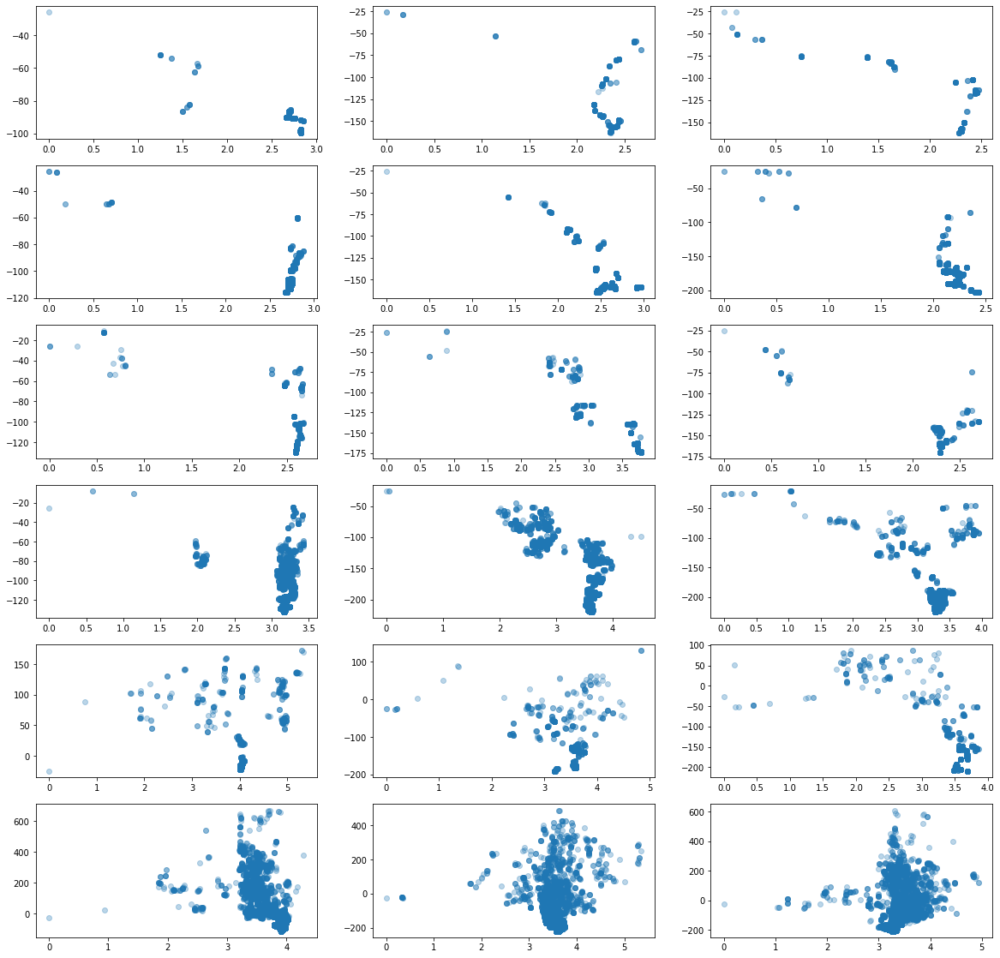

In [31]:
f = plt.figure()
f, axes = plt.subplots(nrows = 6, ncols = 3, figsize = (20, 20))
sc = axes[0][0].scatter(rmsd['1_0.01_2'], energy['1_0.01_2'], alpha = 0.3)
axes[0][1].scatter(rmsd['1_0.01_10'], energy['1_0.01_10'], alpha = 0.3)
axes[0][2].scatter(rmsd['1_0.01_15'], energy['1_0.01_15'], alpha = 0.3)
axes[1][0].scatter(rmsd['1_0.001_2'], energy['1_0.001_2'], alpha = 0.3)
axes[1][1].scatter(rmsd['1_0.001_10'], energy['1_0.001_10'], alpha = 0.3)
axes[1][2].scatter(rmsd['1_0.001_15'], energy['1_0.001_15'], alpha = 0.3)
axes[2][0].scatter(rmsd['10_0.01_2'], energy['10_0.01_2'], alpha = 0.3)
axes[2][1].scatter(rmsd['10_0.01_10'], energy['10_0.01_10'], alpha = 0.3)
axes[2][2].scatter(rmsd['10_0.01_15'], energy['10_0.01_15'], alpha = 0.3)
axes[3][0].scatter(rmsd['10_0.001_2'], energy['10_0.001_2'], alpha = 0.3)
axes[3][1].scatter(rmsd['10_0.001_10'], energy['10_0.001_10'], alpha = 0.3)
axes[3][2].scatter(rmsd['10_0.001_15'], energy['10_0.001_15'], alpha = 0.3)
axes[4][0].scatter(rmsd['100_0.01_2'], energy['100_0.01_2'], alpha = 0.3)
axes[4][1].scatter(rmsd['100_0.01_10'], energy['100_0.01_10'], alpha = 0.3)
axes[4][2].scatter(rmsd['100_0.01_15'], energy['100_0.01_15'], alpha = 0.3)
axes[5][0].scatter(rmsd['100_0.001_2'], energy['100_0.001_2'], alpha = 0.3)
axes[5][1].scatter(rmsd['100_0.001_10'], energy['100_0.001_10'], alpha = 0.3)
axes[5][2].scatter(rmsd['100_0.001_15'], energy['100_0.001_15'], alpha = 0.3)
plt.show()

Unsurprisingly, in this case we still get RMSD values that are close to the native structure. This is because making small moves when starting at the native will likely result in little change to the conformation.

### Run the program many times until it is close in terms of 
One final possibility is that the algorithm only finds the correct conformation in a subset of the cases. To address this I will run the simulation 100 times and stop it once the RMSD score is less than 3.5.

In [34]:
### Run until close
helix = pose_from_pdb("1gcn.pdb")
results = pd.DataFrame()
rmsd = pd.DataFrame()
names = []
native = Pose()
native.assign(helix)

for k in range(100):
    temperature = 1
    cooling = 0.001

    expName = str(temperature) + "_" + str(cooling)
    names.append(expName)
    scores = []
    rmsd_scores = []

    # Scrable up the structure
    for k in range(helix.total_residue()):
        angle1 = random.randint(0,360)
        angle2 = random.randint(0,360)

        helix.set_phi(k + 1, angle1)
        helix.set_psi(k + 1, angle2)

    while temperature > 0.005:
        # Calculate the current score
        current_score = scorefxn(helix)
        current_rmsd = pyrosetta.rosetta.core.scoring.CA_rmsd(native, helix)
        
        if current_rmsd < 3.5:
            print("Reached something similar")
            
            break

        scores.append(current_score)
        rmsd_scores.append(current_rmsd)

        # Create a deepcopy permutation
        temp_helix = Pose()
        temp_helix.assign(helix)

        # Make a change to the temporary confirmation
        changeConfirmation(temp_helix)

        # Calculate the score of the new permutation
        new_score = scorefxn(temp_helix)

        if new_score < current_score:
            helix = temp_helix
        else:
            delta = abs(new_score - current_score)
            prob = math.exp(-delta/temperature)

            test_prob = random.uniform(0, 1)

            if(test_prob < prob):
                helix = temp_helix

        temperature = temperature * (1 - cooling)

    scores = pd.Series(scores)
    rmsd_scores = pd.Series(rmsd_scores)
    results = pd.concat([results, scores], ignore_index = True, axis = 1)
    rmsd = pd.concat([rmsd, rmsd_scores], ignore_index = True, axis = 1)
    print(scorefxn.show(helix))
    #print(len(scores))
    
    if current_rmsd < 3.5:
        break

results.columns = names
view = nv.show_rosetta(helix)
view

core.import_pose.import_pose: File '1gcn.pdb' automatically determined to be of type PDB
core.conformation.Conformation: [ WARNING ] missing heavyatom:  OXT on residue TRP:CtermProteinFull 18
core.scoring.ScoreFunction: 
------------------------------------------------------------
 Scores                       Weight   Raw Score Wghtd.Score
------------------------------------------------------------
 fa_atr                       1.000     -42.851     -42.851
 fa_rep                       0.550      66.588      36.624
 fa_sol                       1.000      35.955      35.955
 fa_intra_rep                 0.005     130.629       0.653
 fa_intra_sol_xover4          1.000       5.171       5.171
 lk_ball_wtd                  1.000      -0.164      -0.164
 fa_elec                      1.000      -7.924      -7.924
 pro_close                    1.250       0.000       0.000
 hbond_sr_bb                 20.000      -5.240    -104.796
 hbond_lr_bb                  1.000       0.000       0.

NGLWidget()

The above simulation ran 100 times, yet it did not find a structure that was close in terms of RMSD value (i.e. less than 3.5). The structure found by the last simulation looked as follows:
<img src="100folding.png" style="height: 200px">

## Conclusions

Regardless of the energy function used to fold the protein, the native conformation could not be found in any simulation. This could be due to a number of things. First, the structure of the glucagon helix used here was determined via X-ray crystallography and was found to take on a helix when in a crystal lattice. Given that I am not modelling the lattice, this might be where some discrepancies may arise. Additionally, the simulation does not contain any water molecules that might help it fold if it were in solution. Second, the Rosetta scoring function was not designed for folding such short peptides, making this another potential source of errors. 

Nonetheless, the scoring function used can fold the protein somewhat accurately if the simulation is started from the native conformation. Given that this is possible even at very high temperatures could indicate that the energy landscape is somewhat flat everywhere and the minimum is only reachable via a narrow entrace (depicted below).

A two dimensional represenation of the multidimensional energy landscape probably looks something like the following:


<img src="energy_landscape.jpg" style="height: 200px">

## References
- Chaudhury, S., Lyskov, S., & Gray, J. J. (2010). PyRosetta: a script-based interface for implementing molecular modeling algorithms using Rosetta. Bioinformatics, 26(5), 689-691.
- Pierce, N. A., & Winfree, E. (2002). Protein design is NP-hard. Protein engineering, 15(10), 779-782.

#### Image sources
Chem libre texts
https://chem.libretexts.org/Bookshelves/Physical_and_Theoretical_Chemistry_Textbook_Maps/Supplemental_Modules_(Physical_and_Theoretical_Chemistry)/Physical_Properties_of_Matter/Atomic_and_Molecular_Properties/Intermolecular_Forces/Specific_Interactions/Lennard-Jones_Potential

Wikipedia

https://en.wikipedia.org/wiki/Ramachandran_plot#/media/File:Protein_backbone_PhiPsiOmega_drawing.svg